PROJECT TITLE: TRAFFIC NETWORK ANALYSIS OF BANGALORE CITY
TEAM MEMBERS:
1. RAKSHIKA S PES2UG20CS262
2. SHRAVYA U PES2UG20CS326
3. ABHAY K P PES2UG20CS411

INSTRUCTIONS:
1. Install latest geopandas
2. Load the bangalore-wards-2020-1-OnlyWeekdays-HourlyAggregate.csv file and the bangalore_wards.json file.

In [2]:
pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import numpy as np
import networkx as nx
import geopandas as gpd
import json
from shapely.geometry import shape
from shapely.validation import make_valid
from sklearn.metrics.pairwise import haversine_distances
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import cm, colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from typing import Dict, List, Tuple , Optional, Callable
import pandas as pd
from copy import deepcopy
from collections import defaultdict

In [4]:
import os

# Important constants
CITY_NAME = 'Bangalore'
GEOJSON_PATH = os.path.join('data', '/content/bangalore_wards.json')
TRAVEL_TIMES_DATA_PATH = os.path.join('data', '/content/bangalore-wards-2020-1-OnlyWeekdays-HourlyAggregate.csv')

In [5]:
def get_geodataframe(geojson_file_path: str) -> gpd.GeoDataFrame: #Returns GeoDataFrame
    with open(geojson_file_path) as f:
        # Load the geojson file and keep just the `features` field
        geo_json = json.load(f)
        geo_json = geo_json['features']

        for g in geo_json:
            # Overwrite the `geometry` field by computing the actual geometry shape from the geojson
            g['geometry'] = shape(g['geometry'])
            # Create a field for each subfield of `properties`
            for k, v in g['properties'].items():
                g[k] = v
            # Delete unuseful fields
            del g['properties']
            del g['type']

    # Create geopandas dataframe
    gdf = gpd.GeoDataFrame(geo_json)

    return gdf

In [6]:
gdf = get_geodataframe(GEOJSON_PATH)
print(f'Geodataframe of {CITY_NAME}:')
gdf.head()

Geodataframe of Bangalore:


,geometry,WARD_NO,WARD_NAME,MOVEMENT_ID,DISPLAY_NAME
0,"MULTIPOLYGON (((77.59229 13.09720, 77.59094 13...",2,Chowdeswari Ward,1,"Unnamed Road, Bengaluru"
1,"MULTIPOLYGON (((77.56862 13.12705, 77.57064 13...",3,Atturu,2,"9th Cross Bhel Layout, Adityanagar, Vidyaranya..."
2,"MULTIPOLYGON (((77.59094 13.09842, 77.59229 13...",4,Yelahanka Satellite Town,3,"15th A Cross Road, Yelahanka Satellite Town, Y..."
3,"MULTIPOLYGON (((77.67683 13.01147, 77.67695 13...",51,Vijnanapura,4,"SP Naidu Layout 4th Cross Street, SP Naidu Lay..."
4,"MULTIPOLYGON (((77.72899 13.02061, 77.72994 13...",53,Basavanapura,5,"Medahalli Kadugodi Road, Bharathi Nagar, Krish..."


In [7]:
def set_geodataframe_centroids(gdf: gpd.GeoDataFrame) -> None: #Set the centroid value of each entry in the geodataframe based on their geometry.
    gdf['centroid'] = gdf.geometry.apply(lambda x: x.centroid)

In [8]:
set_geodataframe_centroids(gdf)
print(f'Geodataframe of {CITY_NAME} after the centroid computation:')
gdf.head()

Geodataframe of Bangalore after the centroid computation:


,geometry,WARD_NO,WARD_NAME,MOVEMENT_ID,DISPLAY_NAME,centroid
0,"MULTIPOLYGON (((77.59229 13.09720, 77.59094 13...",2,Chowdeswari Ward,1,"Unnamed Road, Bengaluru",POINT (77.58042 13.12171)
1,"MULTIPOLYGON (((77.56862 13.12705, 77.57064 13...",3,Atturu,2,"9th Cross Bhel Layout, Adityanagar, Vidyaranya...",POINT (77.56004 13.10280)
2,"MULTIPOLYGON (((77.59094 13.09842, 77.59229 13...",4,Yelahanka Satellite Town,3,"15th A Cross Road, Yelahanka Satellite Town, Y...",POINT (77.58393 13.09099)
3,"MULTIPOLYGON (((77.67683 13.01147, 77.67695 13...",51,Vijnanapura,4,"SP Naidu Layout 4th Cross Street, SP Naidu Lay...",POINT (77.66957 13.00606)
4,"MULTIPOLYGON (((77.72899 13.02061, 77.72994 13...",53,Basavanapura,5,"Medahalli Kadugodi Road, Bharathi Nagar, Krish...",POINT (77.71546 13.01685)


In [9]:
def get_spatial_network(gdf: gpd.GeoDataFrame) -> nx.Graph: #Returns Graph of The spatial network.
    # Get adjacecy dictionary
    adjacency_dict = _get_spatial_network_adjacency_dict(gdf)

    # Get the spatial network
    spatial_network = nx.from_dict_of_dicts(adjacency_dict)
    return spatial_network

In [10]:
def _get_spatial_network_adjacency_dict(gdf: gpd.GeoDataFrame) -> Dict[int, Dict[str, float]]: #Get the spatial network adjacency dictionary.

    adjacency_dict = dict()
    
    gdf.geometry = gdf.geometry.apply(lambda x: make_valid(x))

    for row in gdf.itertuples(index=False):
        # Get the row ID and centroid
        row_id, row_centroid = row.MOVEMENT_ID, row.centroid

        # Get "not-disjoint" locations to the current row (i.e.: the neighbor locations)
        neighbors = gdf[(~gdf.geometry.disjoint(row.geometry)) & (gdf.MOVEMENT_ID != row_id)]

        # Get the neighbor IDs and centroids
        neighbor_ids, neighbor_centroids = neighbors.MOVEMENT_ID.tolist(), neighbors.centroid.tolist()

        # Compute haversine distances between each neighbour centroid and the row centroid
        distances = [haversine_distances([[row_centroid.x, row_centroid.y], [c.x, c.y]])[0,1] for c in neighbor_centroids]

        # Add adjacency dict entry for the current row based on its ID
        adjacency_dict[row_id] = { n: {'weight': d } for n, d in zip(neighbor_ids, distances) }
        
    return adjacency_dict

In [11]:
spatial_network = get_spatial_network(gdf)

In [12]:
print(f'Number of nodes in the spatial network: {len(spatial_network.nodes())}')
print(f'Number of edges in the spatial network: {len(spatial_network.edges())}')
print(f'Spatial network density: {nx.density(spatial_network)}')

Number of nodes in the spatial network: 198
Number of edges in the spatial network: 582
Spatial network density: 0.029841562836486694


In [13]:
print(f'The spatial network is directed: {nx.is_directed(spatial_network)}')

The spatial network is directed: False


In [14]:
def plot_spatial_network(gdf: gpd.GeoDataFrame, spatial_network: nx.Graph, title: str = 'Spatial network') -> None: #Plot the spatial network on the map of the city.

    _, ax = plt.subplots(1, 1, figsize=(15, 10))

    gdf.plot(ax=ax, edgecolor='darkgray', color='white')

    coordinates = get_geodataframe_coordinates_dict(gdf)

    nx.draw(
        spatial_network,
        coordinates,
        ax=ax,
        node_size=20,
        width=1,
        node_color="black",
        edge_color="black",
        alpha=.6,
    )

    plt.title(title)

    plt.show()

In [15]:
def normalize_centrality_measures(centrality_dict: Dict[int, Dict[str, float]]) -> Dict[int, Dict[str, float]]: #Function to normalize with min-max scale the centrality measures across a dictionary of dictionaries of metrics results

    centrality_dict = deepcopy(centrality_dict)
    
    values_list = [v for centralities in centrality_dict.values() for v in centralities.values()]
    min_value = min(values_list)
    max_value = max(values_list)
    
    for centralities in centrality_dict.values():
        for k, v in centralities.items():
            centralities[k] = (v - min_value) / (max_value - min_value)

    return centrality_dict

In [16]:
def get_modularity_score(network: nx.Graph, node_community_dict: Dict[str, int], weight: str) -> float: #Function to get the modularity score of a network partition.

    communities_labels = set(node_community_dict.values())
    communities = {l: [] for l in communities_labels}
    for k, v in node_community_dict.items():
        communities[v].append(k)
    return nx.community.modularity(network, communities.values(), weight=weight)

In [17]:
def get_geodataframe_coordinates_dict(gdf: gpd.GeoDataFrame) -> Dict[int, Tuple[int, int]]: #Get the dictionary of the coordinates of the centroids of each element in the geodataframe.
    coordinates = dict()
    for r in gdf.itertuples(index=False):
        coordinates[r.MOVEMENT_ID] = (r.centroid.x, r.centroid.y)
    return coordinates

def set_geodataframe_centroids(gdf: gpd.GeoDataFrame) -> None:
    #Set the centroid value of each entry in the geodataframe based on their geometry.
    gdf['centroid'] = gdf.geometry.apply(lambda x: x.centroid)

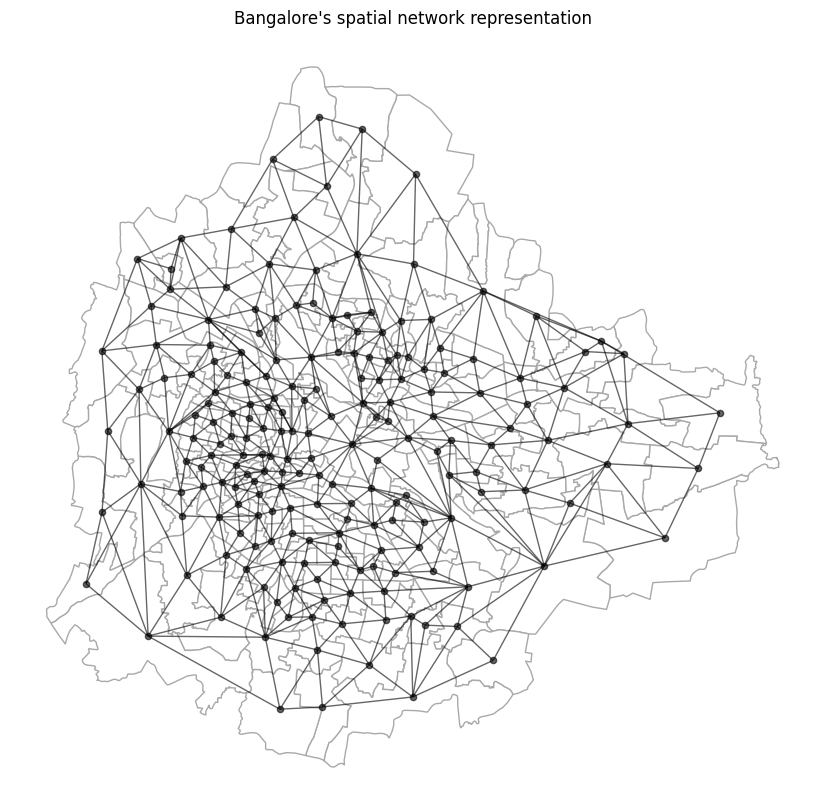

In [18]:
plot_spatial_network(gdf, spatial_network, title=f"{CITY_NAME}'s spatial network representation")

In [19]:
def get_movement_dataframe(csv_path: str) -> pd.DataFrame: #Function to obtain a pandas dataframe from the Uber Movement data.

    df = pd.read_csv(csv_path)
    df.drop(['standard_deviation_travel_time', 'geometric_mean_travel_time', 'geometric_standard_deviation_travel_time'],
            inplace=True, axis=1)
    
    df['sourceid'] = df['sourceid'].apply(str)
    df['dstid'] = df['dstid'].apply(str)
    
    return df

In [20]:
df = get_movement_dataframe(TRAVEL_TIMES_DATA_PATH)

print(f"{CITY_NAME}'s movement dataframe:")
df.head()

Bangalore's movement dataframe:


,sourceid,dstid,hod,mean_travel_time
0,147,101,7,1586.18
1,146,111,7,1230.46
2,182,64,22,2588.65
3,144,131,7,1011.55
4,187,14,22,1674.23


In [21]:
class TemporalNetwork(nx.DiGraph): #Class representing a temporal directed network.
    def __init__(self) -> None:
        super().__init__()
        
    def to_undirected(self) -> nx.Graph: #Function to turn the network from directed to undirected
        
        undirected_network = nx.Graph()
        
        undirected_network.add_nodes_from(self.nodes)

        undirected_network.add_edges_from(self.edges(), mean_travel_time=0)

        for u, v, d in self.edges(data=True):
            undirected_network[u][v]['mean_travel_time'] += d['mean_travel_time']
            
        for u, v in undirected_network.edges():
            if self.has_edge(u, v) and self.has_edge(v, u):
                undirected_network[u][v]['mean_travel_time'] /= 2
                
        return undirected_network


In [22]:
def get_temporal_networks_from_pandas_edgelist(df: pd.DataFrame, hours: List[int]) -> Dict[int, TemporalNetwork]: #Function to build the dictionary of temporal networks at a specific hour from a pandas dataframe containing the edge data.

    return {
        h: nx.from_pandas_edgelist(
            df[df.hod == h],
            source='sourceid',
            target='dstid',
            edge_attr='mean_travel_time',
            create_using=TemporalNetwork())
        for h in hours
    }


In [23]:
temporal_networks_dict = get_temporal_networks_from_pandas_edgelist(df, [0, 8, 13, 20])

In [24]:
for k, v in temporal_networks_dict.items():
   print(f'Temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())} density: {nx.density(v)}') 

Temporal network at time 0: nodes: 198 edges: 30196 density: 0.7741373122083782
Temporal network at time 8: nodes: 198 edges: 35185 density: 0.9020407116853817
Temporal network at time 13: nodes: 198 edges: 35672 density: 0.9145259703635338
Temporal network at time 20: nodes: 198 edges: 34974 density: 0.8966312874942317


In [25]:
for k, v in temporal_networks_dict.items():
    print(f'Temporal network at time {k} is directed: {nx.is_directed(v)}') 

Temporal network at time 0 is directed: True
Temporal network at time 8 is directed: True
Temporal network at time 13 is directed: True
Temporal network at time 20 is directed: True


Centrality

In [26]:
def get_nodes_in_degree_centrality(network: nx.Graph, normalize: bool = True,
                                   weight: Optional[str] = None) -> Dict[str, float]:
    #Returns : Dictionary where the keys are nodes and the values the relative centrality values.
    metric_dict = { n: network.in_degree(n, weight=weight) for n in network.nodes() }
    return metric_dict if not normalize else _normalize_metric(metric_dict)


In [27]:
temporal_networks_in_degrees = {
    k: get_nodes_in_degree_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

In [28]:
def plot_centrality(gdf: gpd.GeoDataFrame, spatial_network: nx.Graph, metric_dictionary: Dict[str, float],
                title: str = 'Metric plot', cmap: colors.LinearSegmentedColormap = plt.cm.YlGnBu) -> None: #Plot the centrality measure of the nodes over the city map.
    fig, ax = plt.subplots(1, figsize=(15, 10))

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='2%', pad=-.0005)

    gdf.plot(ax=ax, edgecolor='darkgray', color='lightgray')

    coordinates = get_geodataframe_coordinates_dict(gdf)
    node_colors = [metric_dictionary[n] if n in metric_dictionary.keys() else 0 for n in spatial_network.nodes()]

    nx.draw(
        spatial_network,
        coordinates,
        ax=ax,
        node_size=30,
        width=.5,
        node_color=node_colors,
        edge_color="white",
        style='--',
        alpha=.8,
        cmap=cmap,
        vmin=0,
        vmax=1
    )

    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    norm = colors.Normalize(vmin=0, vmax=1)
    fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), cax=cax)

    ax.set_title(title)

    plt.show()


In [29]:
def plot_normalized_temporal_centralities(gdf: gpd.GeoDataFrame, spatial_network: nx.Graph, 
                                          centrality_dict: Dict[int, Dict[str, float]], city_name: str, metric_name: str,
                                          cmap: colors.LinearSegmentedColormap = plt.cm.YlGnBu) -> None: #Plot the centrality measures of a series of temporal networks over the city map.
    
    centrality_dict = normalize_centrality_measures(centrality_dict)

    for k, v in centrality_dict.items():
        plot_centrality(gdf, spatial_network, v, title = f"{city_name}'s {metric_name} centrality at {k:02d}:00", cmap=cmap)

In [30]:
def normalize_centrality_measures(centrality_dict: Dict[int, Dict[str, float]]) -> Dict[int, Dict[str, float]]:
    """Function to normalize with min-max scale the centrality measures across a dictionary of dictionaries of metrics results"""
    centrality_dict = deepcopy(centrality_dict)
    
    values_list = [v for centralities in centrality_dict.values() for v in centralities.values()]
    min_value = min(values_list)
    max_value = max(values_list)
    
    for centralities in centrality_dict.values():
        for k, v in centralities.items():
            centralities[k] = (v - min_value) / (max_value - min_value)

    return centrality_dict

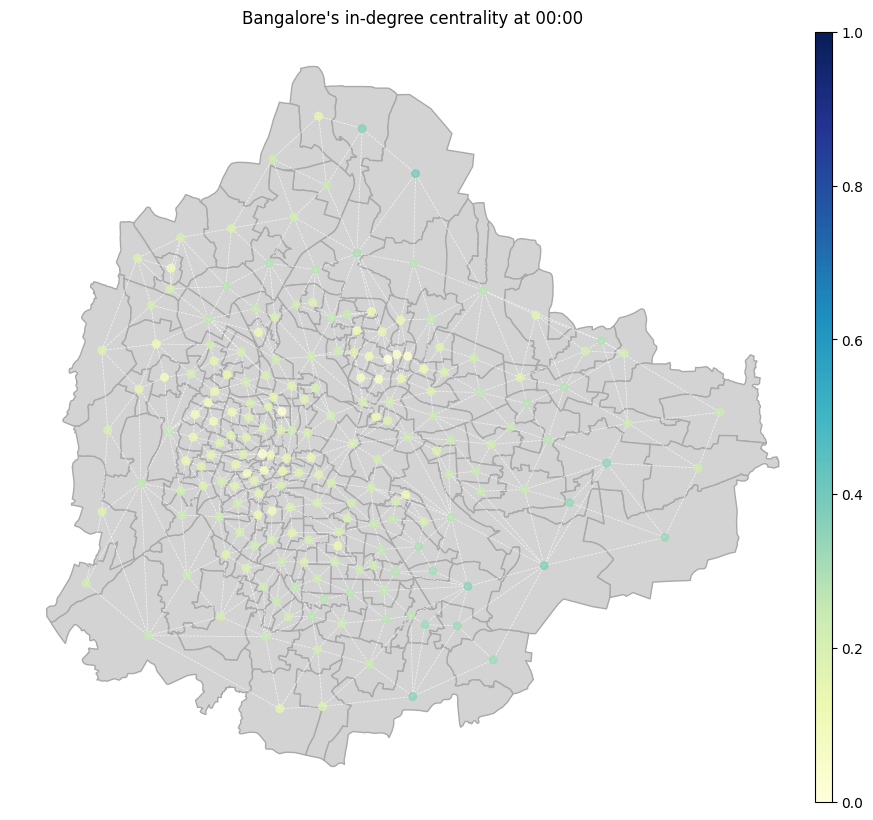

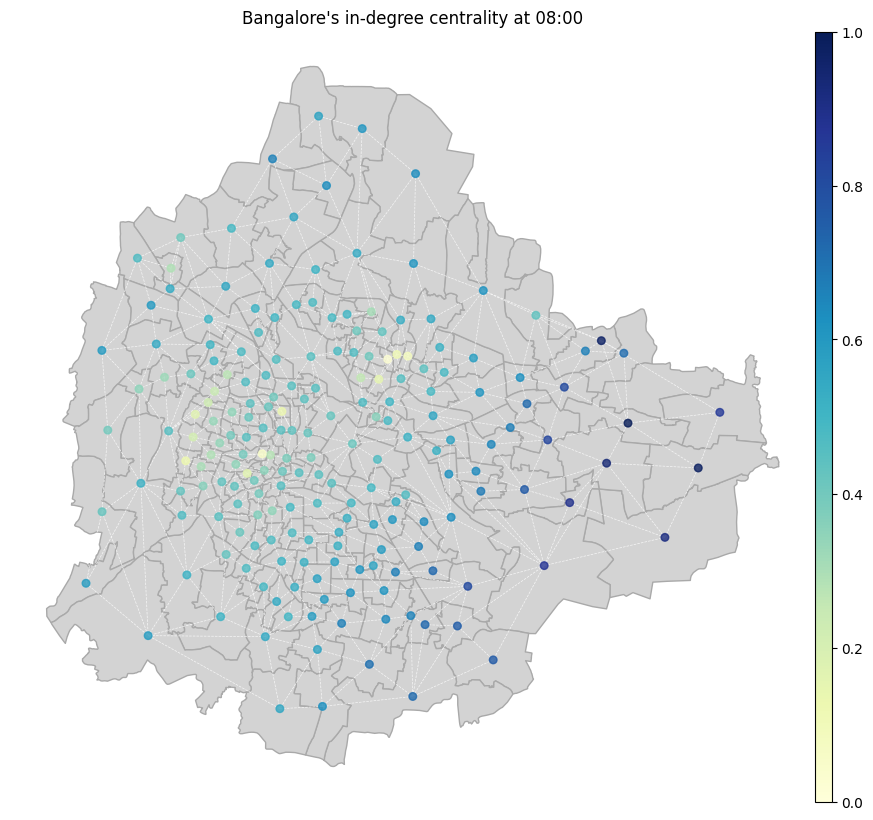

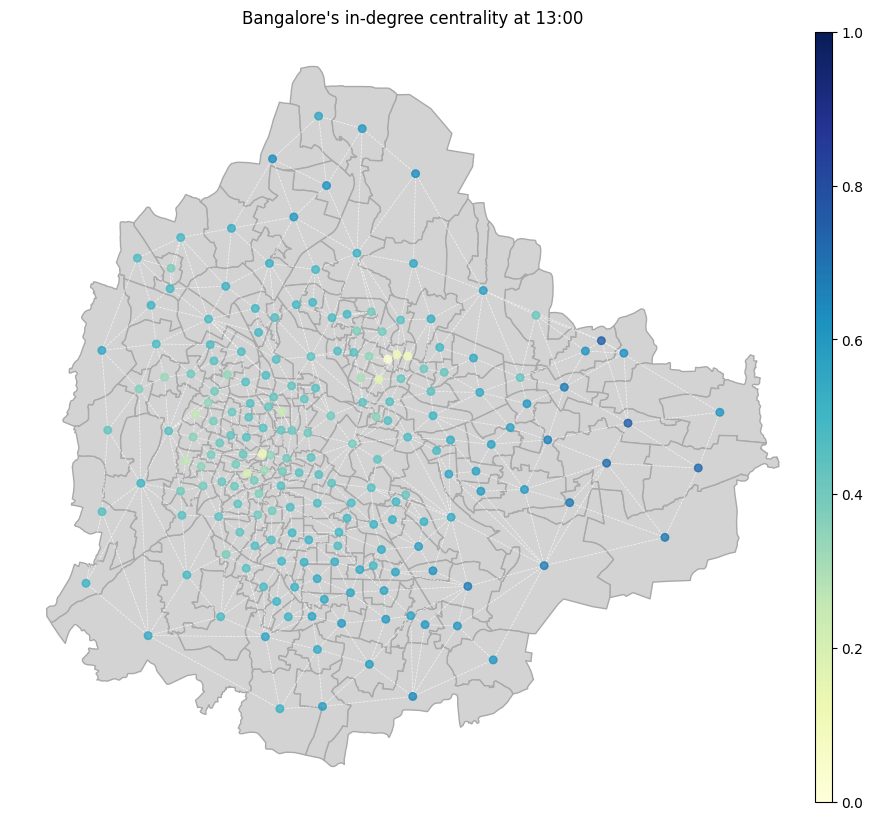

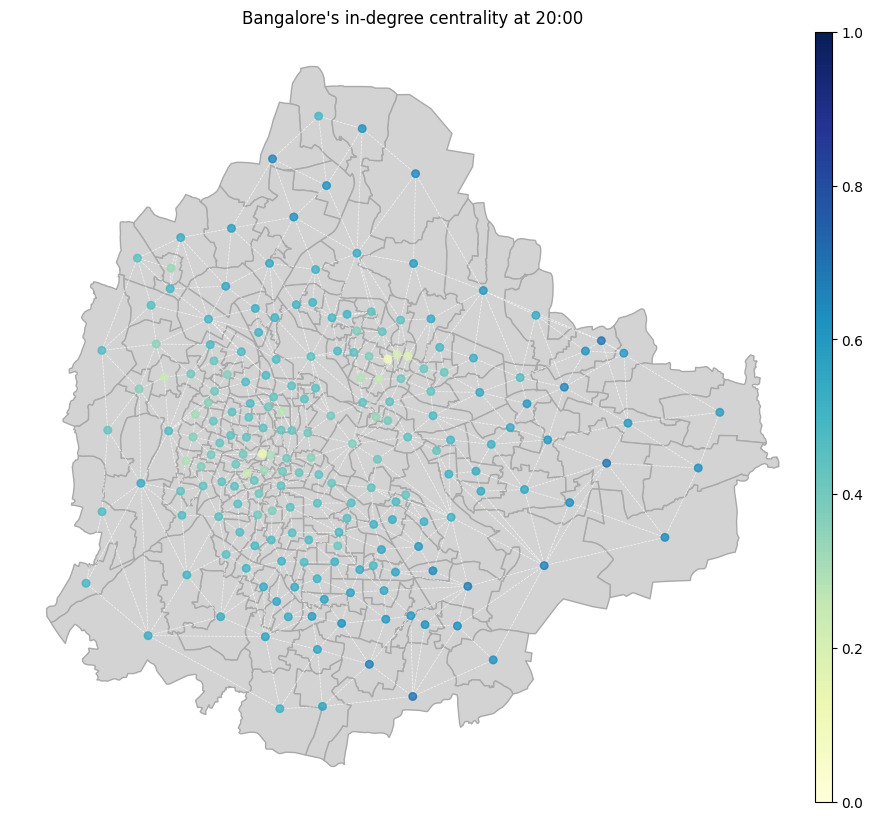

In [31]:
plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_in_degrees, CITY_NAME, 'in-degree')

In [32]:
def plot_temporal_network_centrality_distribution(centralities: Dict[int, Dict[str, float]], metric: str):
    """Plot the centrality distibution and the cumulative centrality distribution in the temporal network."""
    centralities = normalize_centrality_measures(centralities)

    # Histogram
    histograms = dict()
    bins = dict()
    
    for k, v in centralities.items():
        hist, bin_edges = np.histogram(list(v.values()), bins=20, density=False, range=(0., 1.))
        histograms[k] = hist
        bins[k] = bin_edges
    
    width = 0.7 * (bins[0][1] - bins[0][0])
    center = (bins[0][:-1] + bins[0][1:]) / 2
    
    cmap = plt.get_cmap('tab10')
    ylim = max([max(v) for v in histograms.values()])

    plt.figure(figsize=(15, 10))
        
    for i, k in enumerate(centralities.keys()):
        plt.subplot(2, 2, i + 1)  
        plt.xticks(bin_edges[::2])
        plt.bar(center, histograms[k], width=width, color=cmap.colors[i])
        plt.ylim((0, ylim + 10))
        plt.xlabel('centrality')
        plt.title(f'Time {k:02d}:00')
        plt.grid(axis='y')

    plt.suptitle(f'{metric.capitalize()} distributions for the temporal graph')
    plt.show()

    cumsums = dict()
    bins = dict()

    for k, v in centralities.items():
        hist, bin_edges = np.histogram(list(v.values()), bins=20, density=True, range=(0., 1.))
        cumsums[k] = np.cumsum(hist) * (bin_edges[1] - bin_edges[0])
        bins[k] = bin_edges
    center = (bins[0][:-1] + bins[0][1:]) / 2

    # Cumulative distribution
    plt.figure(figsize=(15, 5))
    plt.xticks(bin_edges[::2])
    for k, v in cumsums.items():
        plt.plot(center, v, 'o-', label=f'Time {k:2d}:00')
    plt.suptitle(f'{metric.capitalize()} cumulative distributions for the temporal graph')
    plt.xlabel('centrality')
    plt.grid(axis='y')
    plt.legend(loc='lower center', ncol=len(cumsums), bbox_to_anchor=(.5, -.25),
          columnspacing=8.5)
    plt.show()


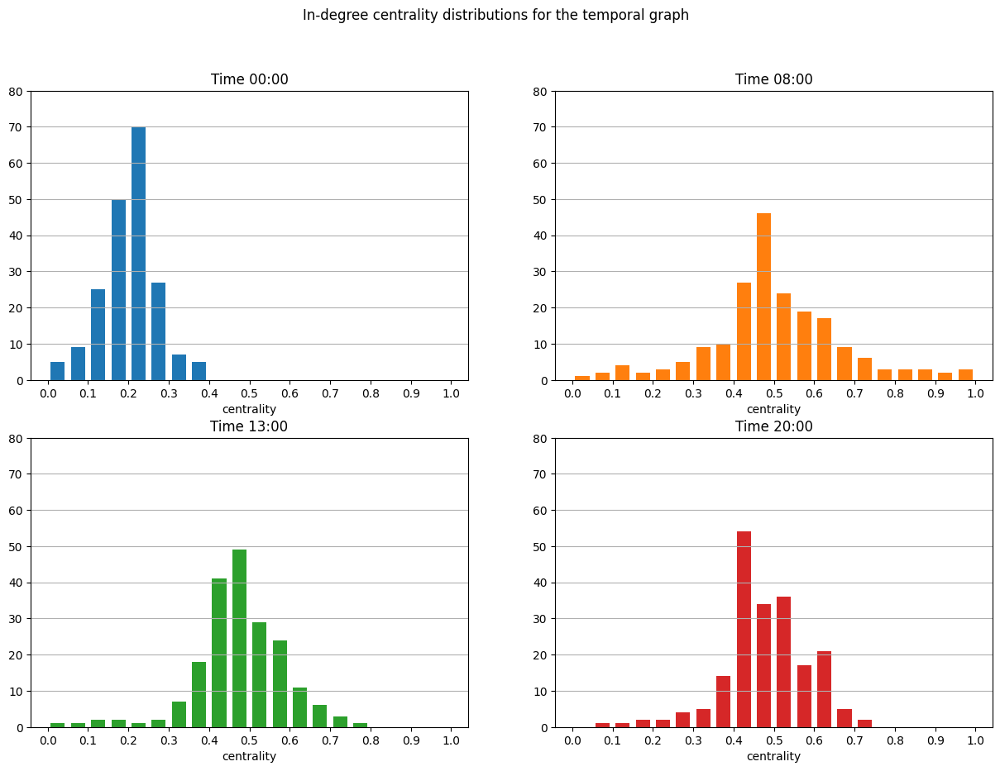

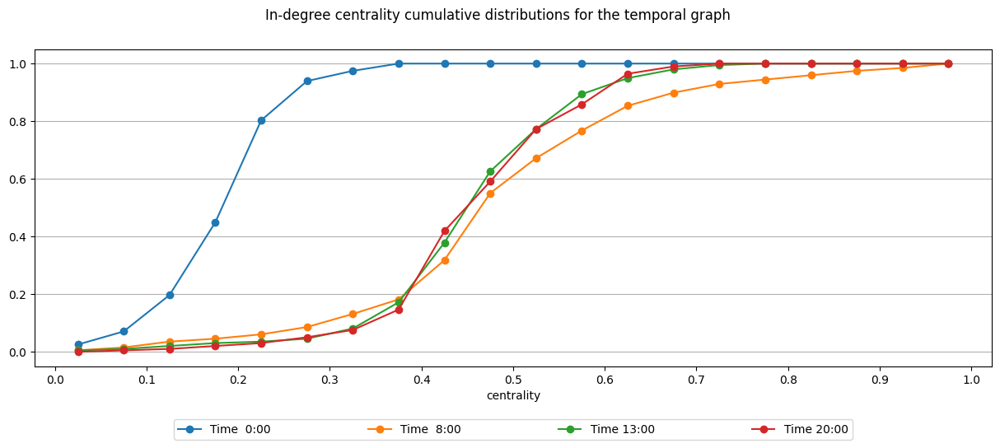

In [33]:
plot_temporal_network_centrality_distribution(temporal_networks_in_degrees, 'in-degree centrality')

In [34]:
def get_nodes_out_degree_centrality(network: nx.Graph, normalize: bool = True,
                                    weight: Optional[str] = None) -> Dict[str, float]:
    """Get the out-degree centrality of all the nodes in the network."""
    metric_dict = { n: network.out_degree(n, weight=weight) for n in network.nodes() }
    return metric_dict if not normalize else _normalize_metric(metric_dict)

In [35]:
temporal_networks_out_degrees = {
    k: get_nodes_out_degree_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

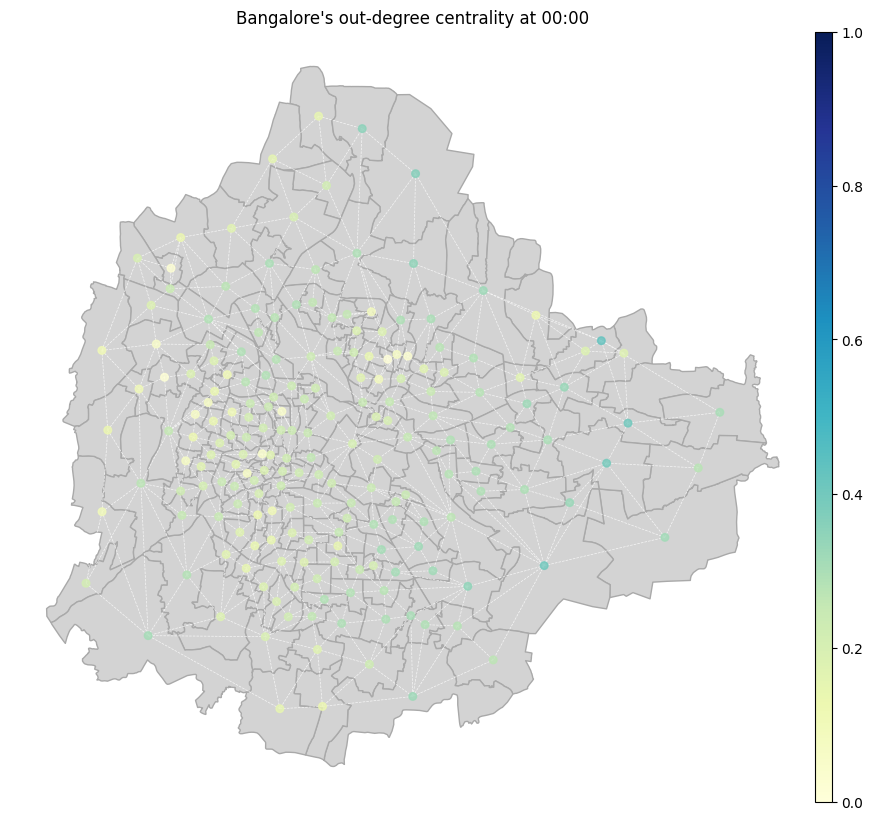

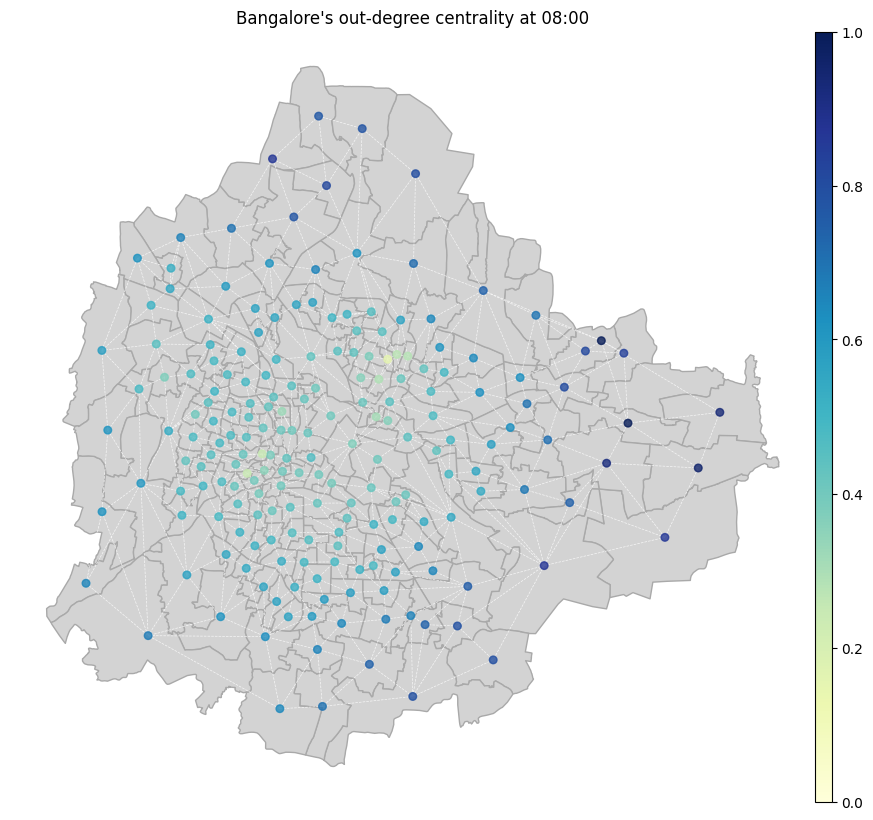

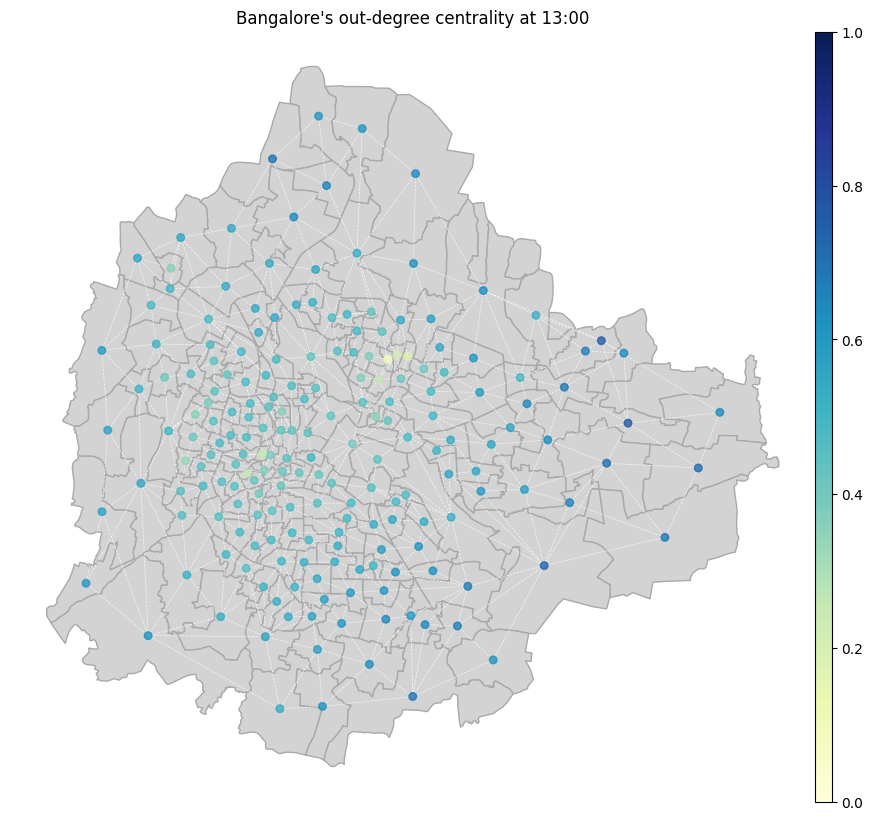

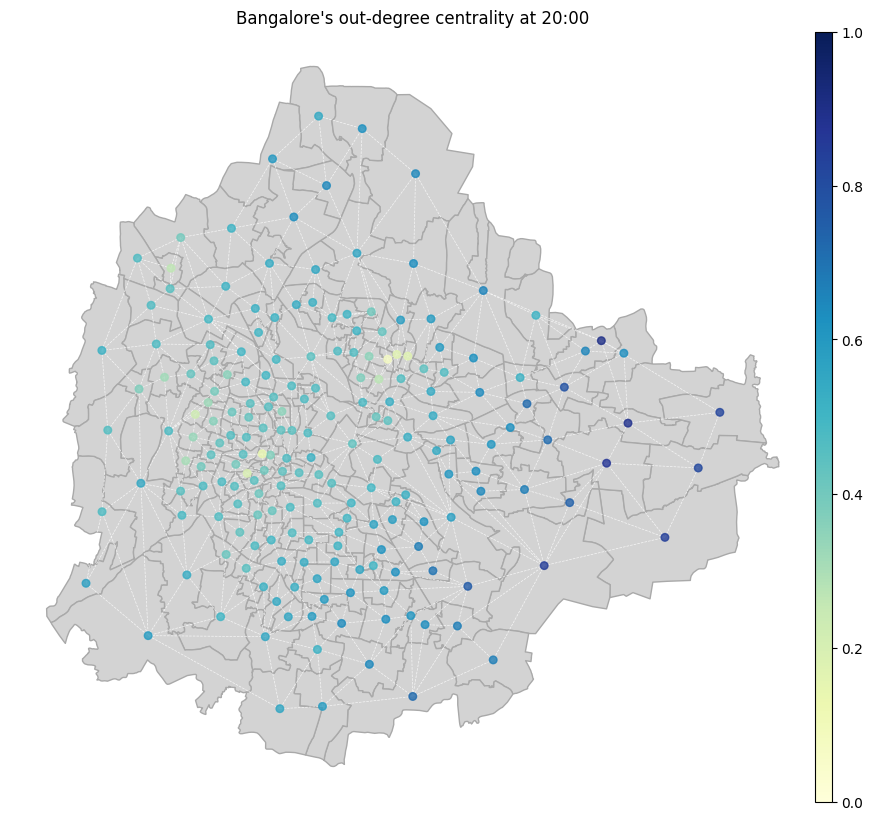

In [36]:
plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_out_degrees, CITY_NAME, 'out-degree')

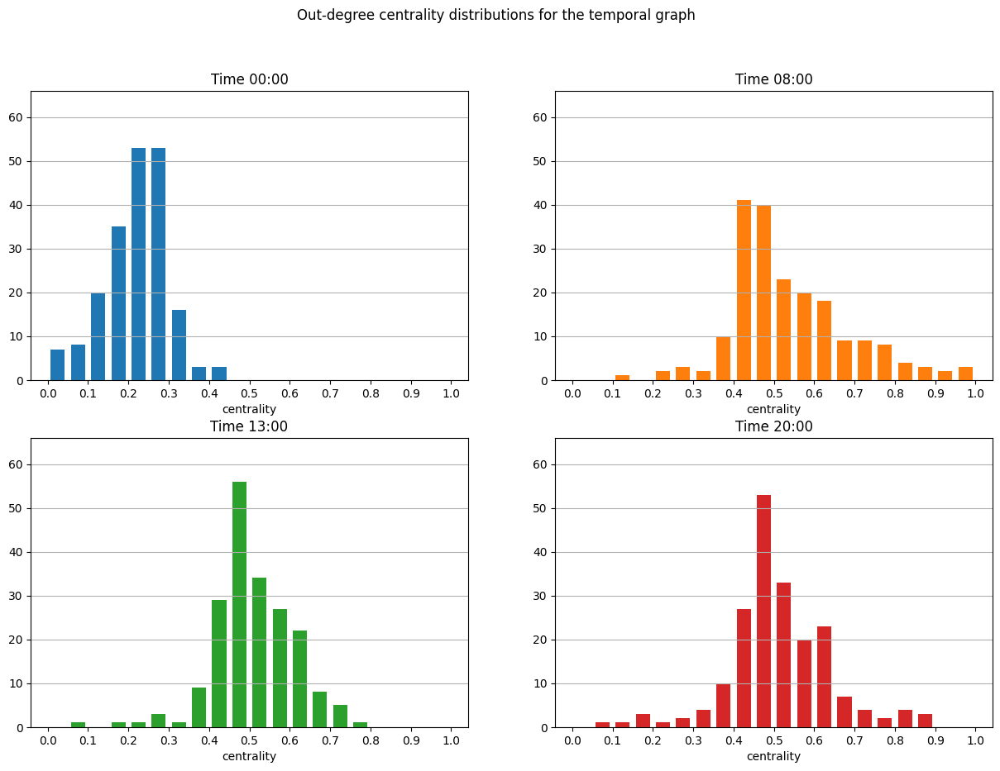

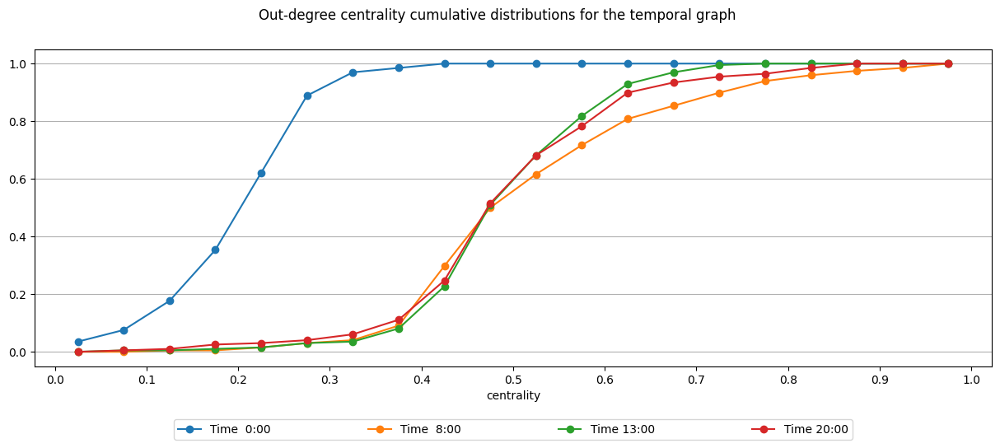

In [37]:
plot_temporal_network_centrality_distribution(temporal_networks_out_degrees, 'out-degree centrality')

Node betweenness

In [38]:
def get_nodes_betweenness_centrality(network: nx.Graph, normalize: bool = True, weight: Optional[str] = None,
                                     seed: int = 42) -> Dict[str, float]: #Get the betweenness centrality of all the nodes in the network.

    metric_dict = nx.betweenness_centrality(network, k=None, normalized=False, weight=weight, endpoints=False, seed=seed)
    return metric_dict if not normalize else _normalize_metric(metric_dict)

In [39]:
temporal_networks_betweenness = {
    k: get_nodes_betweenness_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

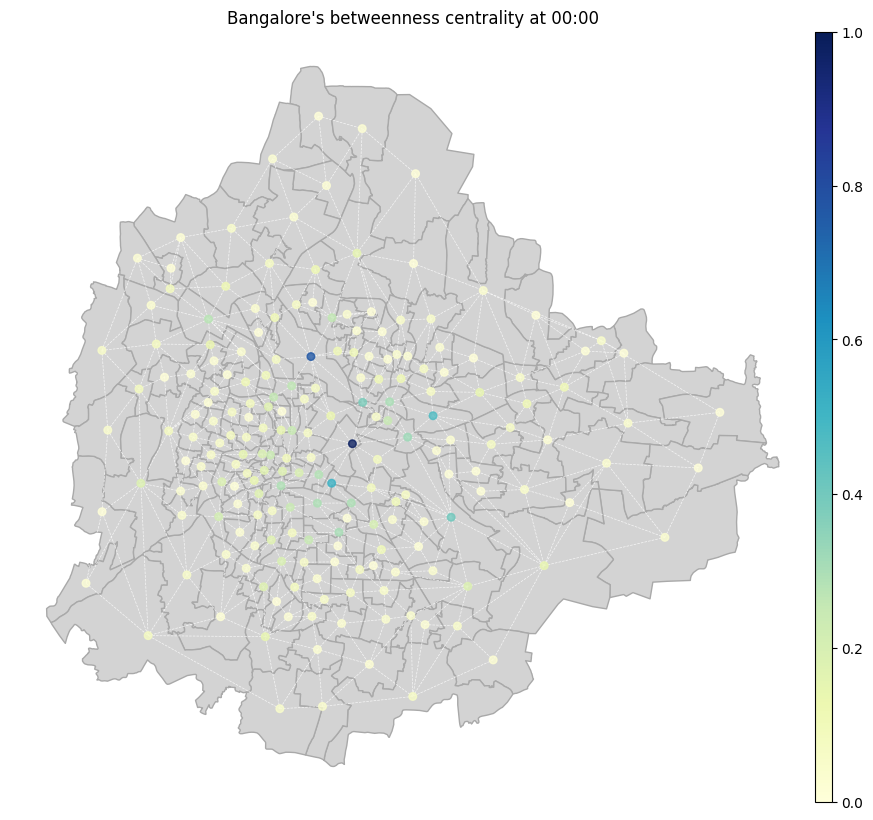

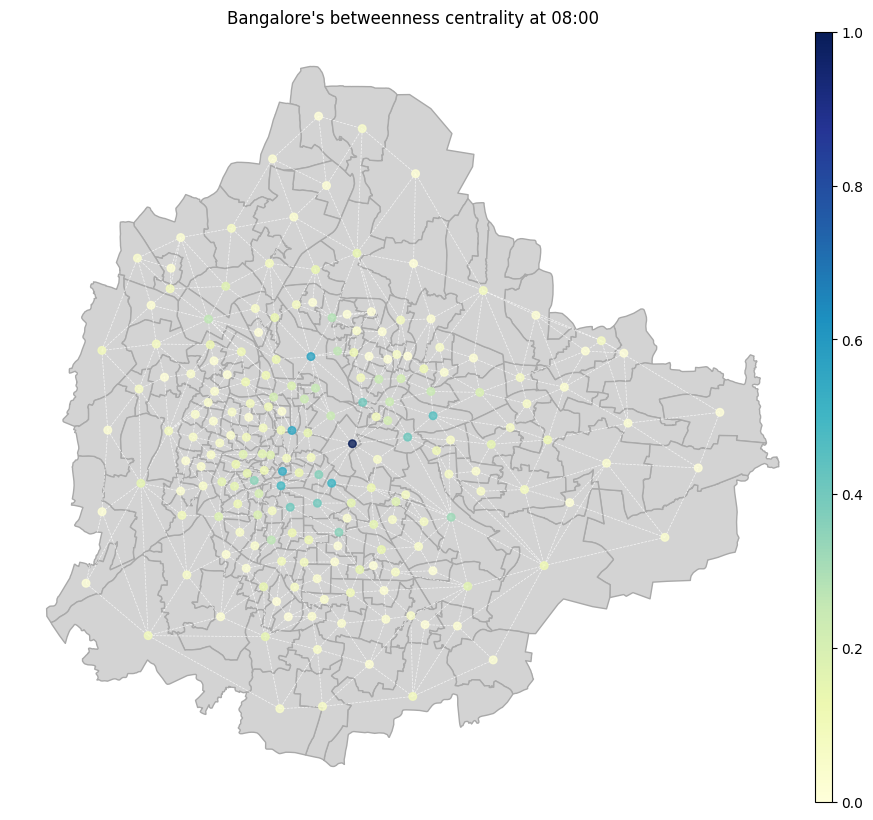

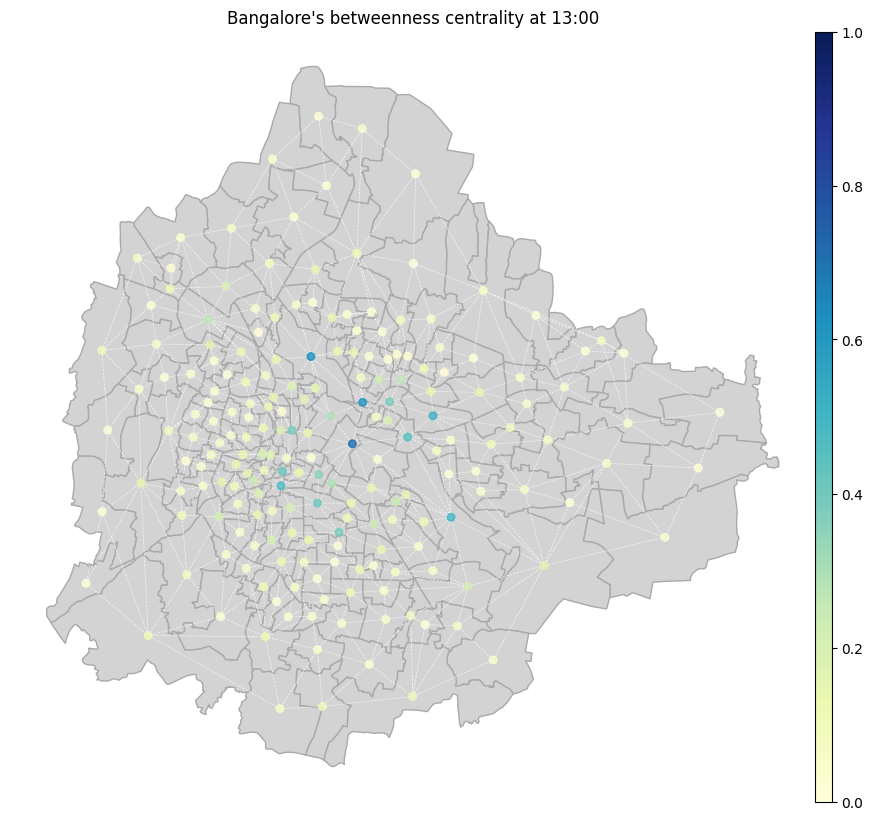

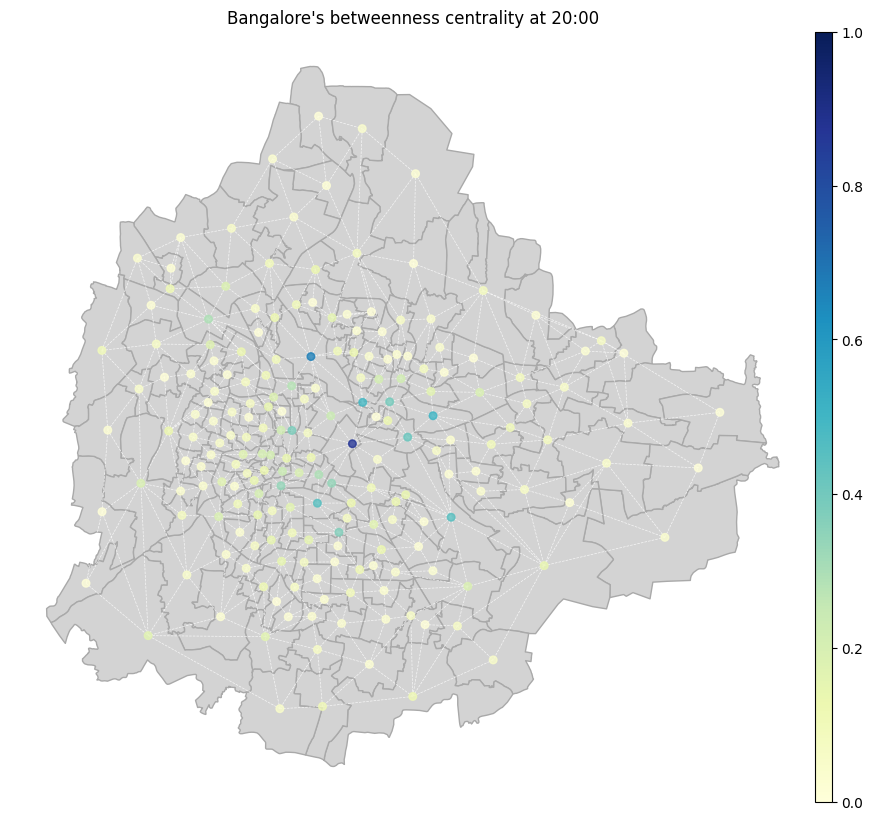

In [40]:
plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_betweenness, CITY_NAME, 'betweenness')

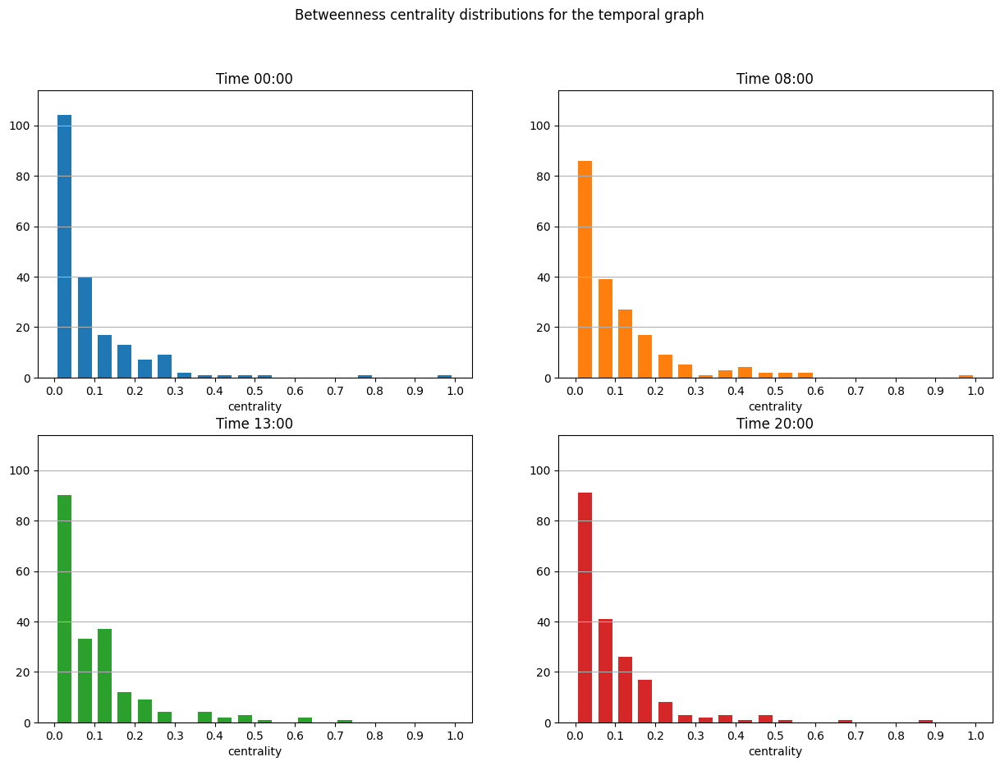

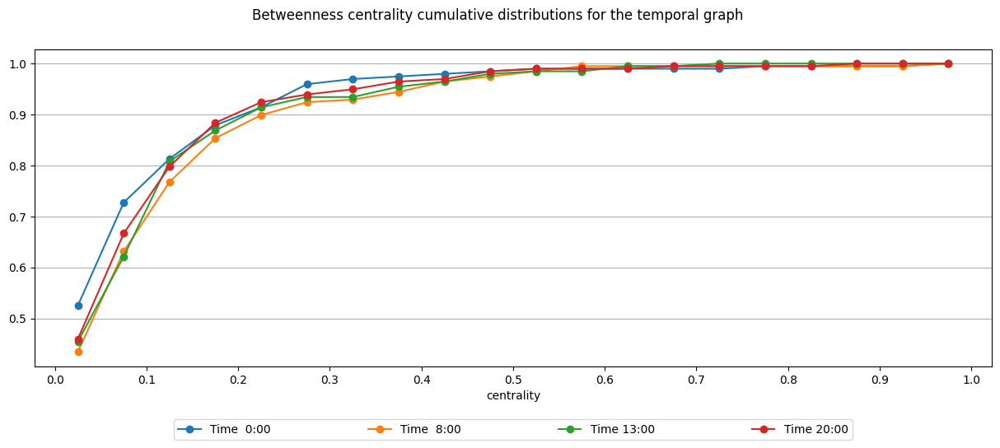

In [41]:
plot_temporal_network_centrality_distribution(temporal_networks_betweenness, 'betweenness centrality')

Spatial network

In [42]:
def get_nodes_betweenness_centrality(network: nx.Graph, normalize: bool = True, weight: Optional[str] = None,
                                     seed: int = 42) -> Dict[str, float]: #Get the betweenness centrality of all the nodes in the network.

    metric_dict = nx.betweenness_centrality(network, k=None, normalized=False, weight=weight, endpoints=False, seed=seed)
    return metric_dict if not normalize else _normalize_metric(metric_dict)

In [43]:
def _normalize_metric(metric_dict: Dict[str, float]) -> Dict[str, float]: #Function to normalize the metric across the whole dictionary according to min-max scale.

    return { n: (v - min(metric_dict.values())) / (max(metric_dict.values()) - min(metric_dict.values())) 
                for n, v in metric_dict.items() }


In [44]:
spatial_network_betweenness = get_nodes_betweenness_centrality(spatial_network, weight='weight', normalize=True)

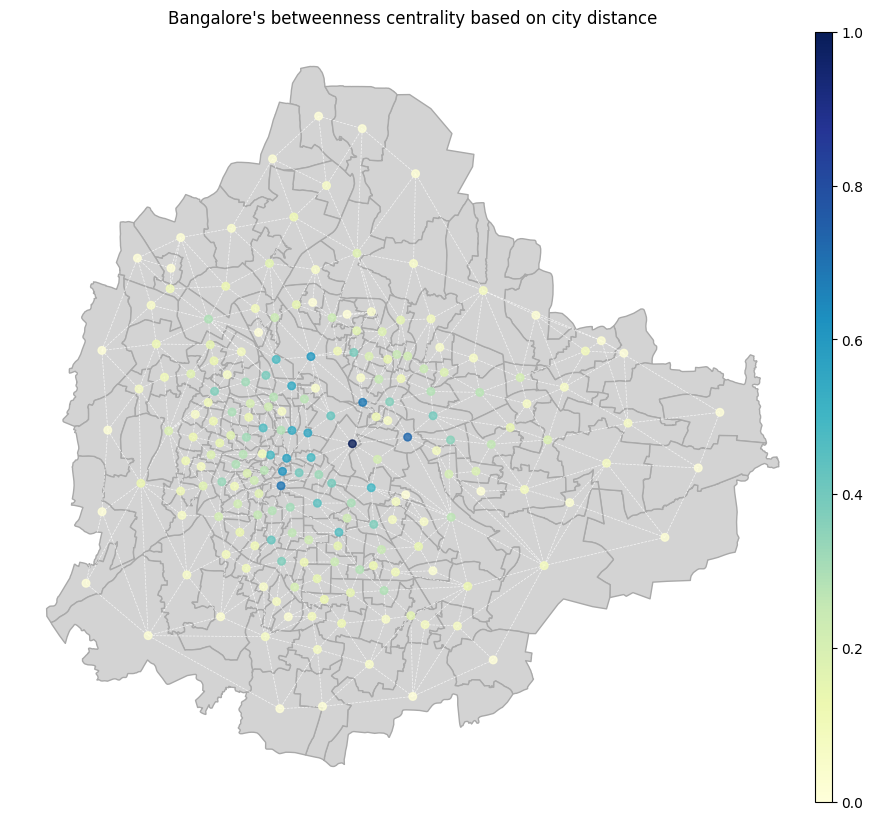

In [45]:
plot_centrality(gdf, spatial_network, spatial_network_betweenness,
                title = f"{CITY_NAME}'s betweenness centrality based on city distance")

In [46]:
def plot_spatial_network_centrality_distribution(centralities: Dict[str, float], metric: str): #Plot the centrality distibution and the cumulative centrality distribution in the spatial network.

    hist, bin_edges = np.histogram(list(centralities.values()), bins=20, density=False, range=(0., 1.))

    width = 0.7 * (bin_edges[1] - bin_edges[0])
    center = (bin_edges[:-1] + bin_edges[1:]) / 2

    cmap = plt.get_cmap('tab10')

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)  
    plt.xticks(bin_edges[::2])
    plt.bar(center, hist, width=width, color=cmap.colors[0])
    plt.xlabel('centrality')
    plt.title(f'{metric.capitalize()} distribution for the spatial network ')
    plt.grid(axis='y')

    hist, bin_edges = np.histogram(list(centralities.values()), bins=20, density=True, range=(0., 1.))
    cumsum = np.cumsum(hist) * (bin_edges[1] - bin_edges[0])
    center = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Cumulative distribution
    plt.subplot(1, 2, 2) 
    plt.xticks(bin_edges[::2])
    plt.plot(center, cumsum, 'o-')
    plt.title(f'{metric.capitalize()} cumulative distribution for the spatial network')
    plt.xlabel('centrality')
    plt.grid(axis='y')
    plt.show()

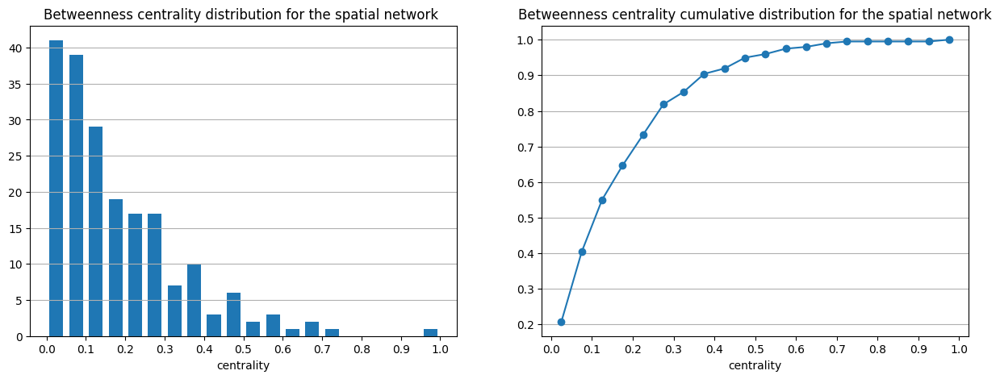

In [47]:
plot_spatial_network_centrality_distribution(spatial_network_betweenness, 'betweenness centrality')

Node closeness

In [48]:
def get_nodes_closeness_centrality(network: nx.Graph, normalize: bool = True,
                                   weight: Optional[str] = None) -> Dict[str, float]: #Get the closeness centrality of all the nodes in the network.

    metric_dict = nx.closeness_centrality(network, u=None, distance=weight)
    return metric_dict if not normalize else _normalize_metric(metric_dict)

In [49]:
temporal_networks_closeness = {
    k: get_nodes_closeness_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

In [50]:
def plot_normalized_temporal_centralities(gdf: gpd.GeoDataFrame, spatial_network: nx.Graph, 
                                          centrality_dict: Dict[int, Dict[str, float]], city_name: str, metric_name: str,
                                          cmap: colors.LinearSegmentedColormap = plt.cm.YlGnBu) -> None: #Plot the centrality measures of a series of temporal networks over the city map.

    centrality_dict = normalize_centrality_measures(centrality_dict)

    for k, v in centrality_dict.items():
        plot_centrality(gdf, spatial_network, v, title = f"{city_name}'s {metric_name} centrality at {k:02d}:00", cmap=cmap)

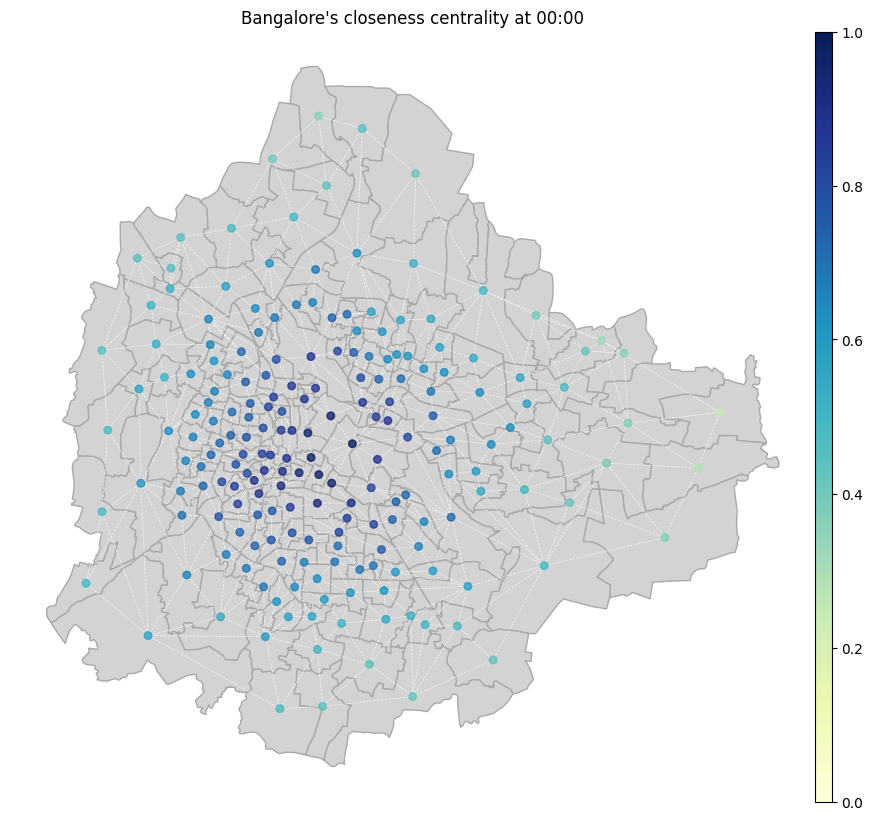

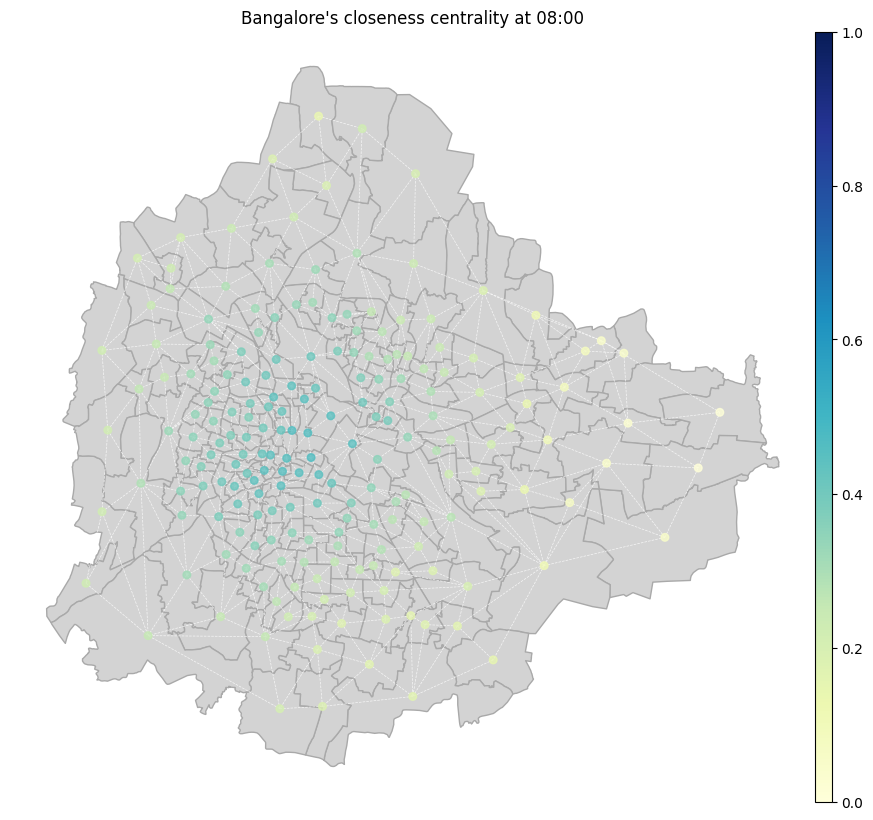

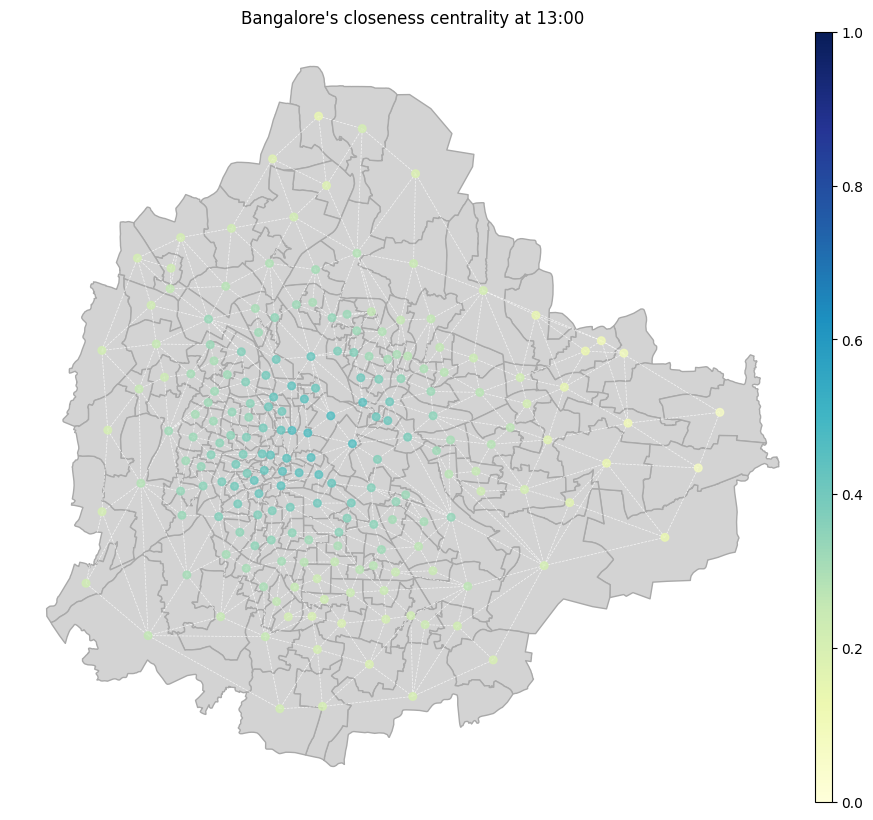

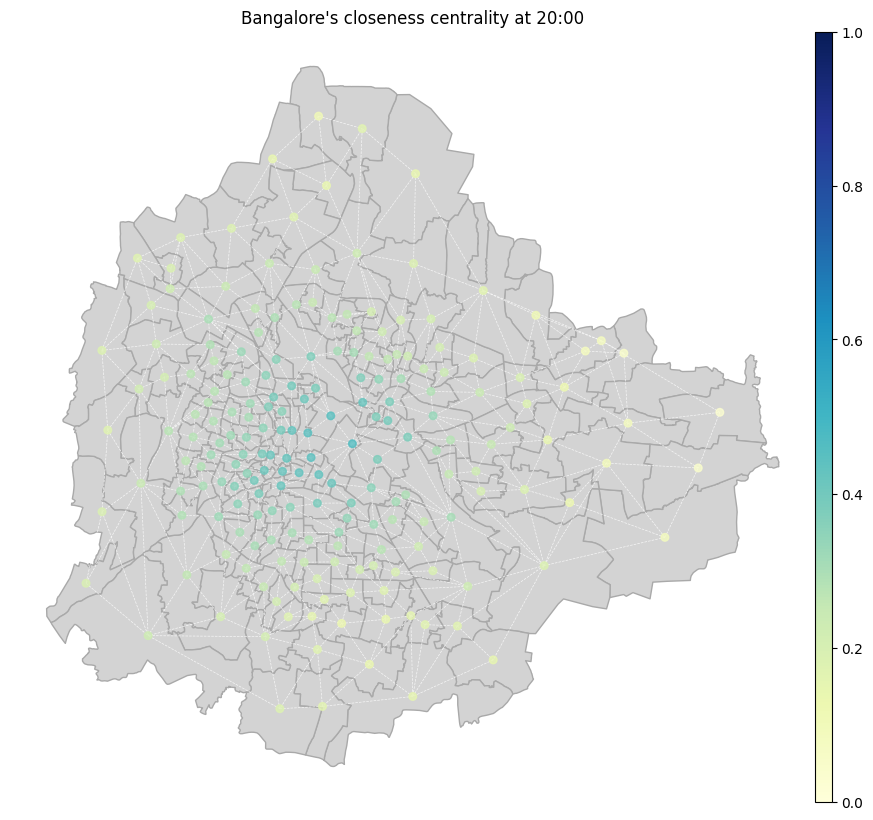

In [51]:
plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_closeness, CITY_NAME, 'closeness')

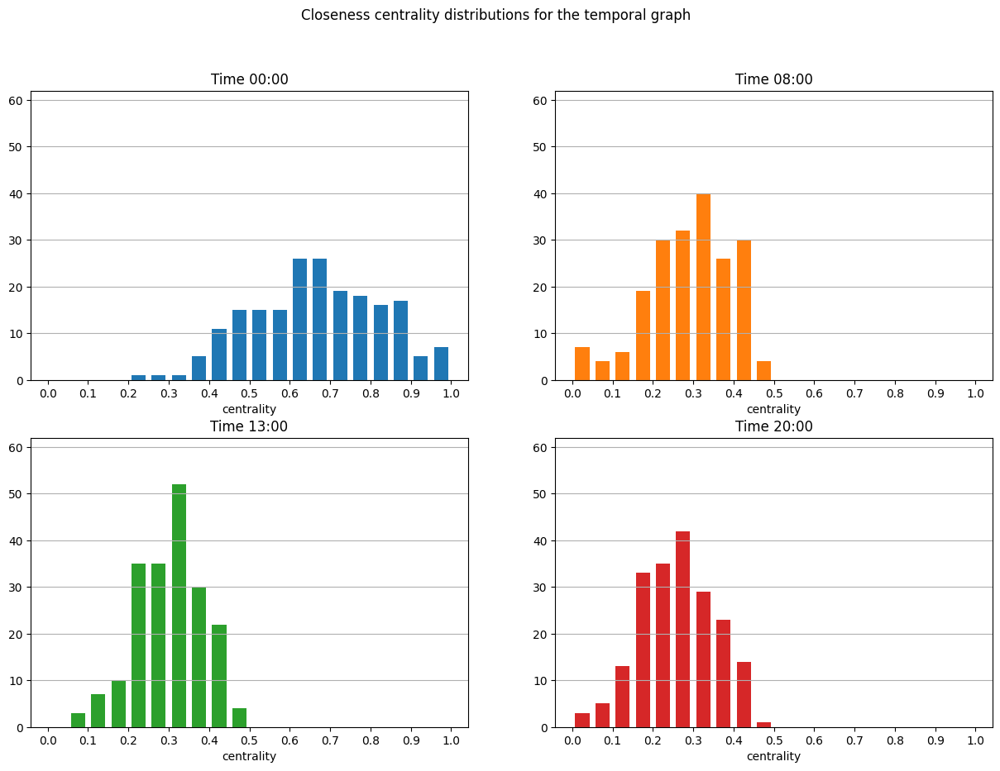

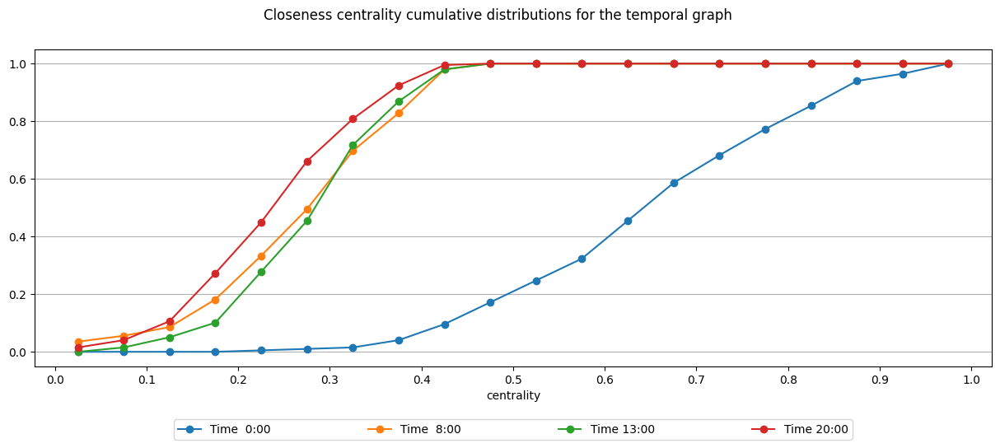

In [52]:
plot_temporal_network_centrality_distribution(temporal_networks_closeness, 'closeness centrality')

Spatial Network

In [53]:
spatial_network_closeness = get_nodes_closeness_centrality(spatial_network, weight='weight', normalize=True)

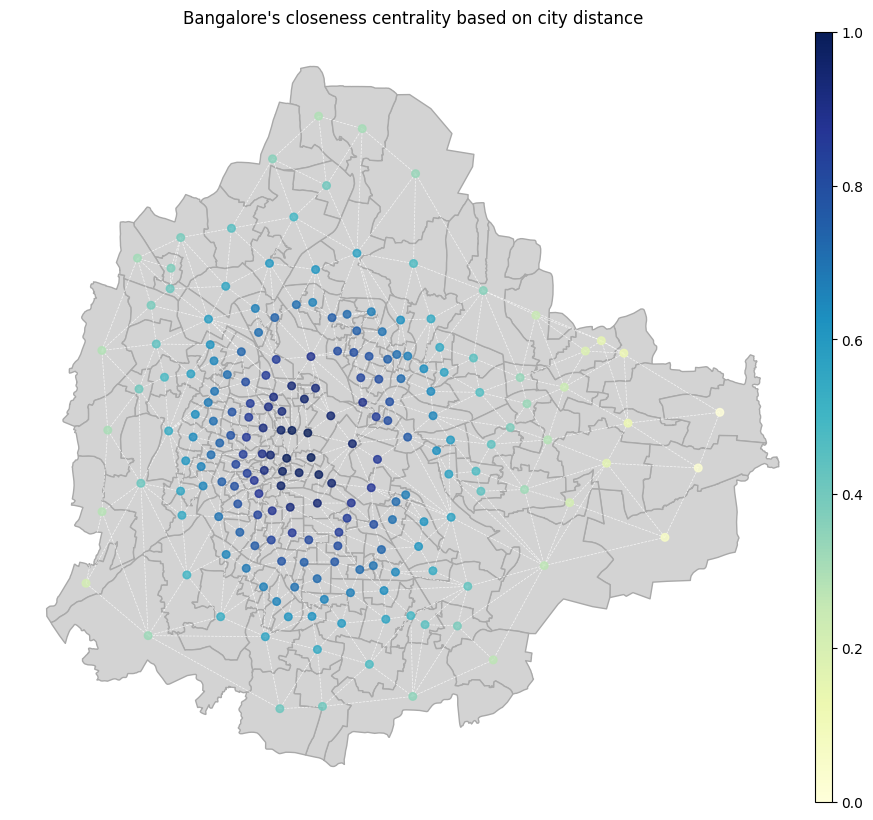

In [54]:
plot_centrality(gdf, spatial_network, spatial_network_closeness,
                title=f"{CITY_NAME}'s closeness centrality based on city distance")

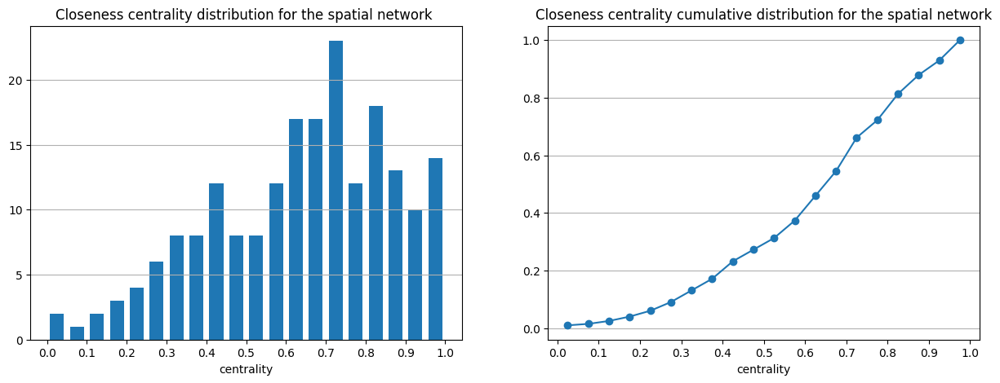

In [55]:
plot_spatial_network_centrality_distribution(spatial_network_closeness, 'closeness centrality')

Pagerank

In [56]:
def get_nodes_pagerank_centrality(network: nx.Graph, normalize: bool = True,
                                  weight: Optional[str] = None) -> Dict[str, float]: #Get the PageRank centrality of all the nodes in the network.

    metric_dict = nx.pagerank(network, alpha=0.85, max_iter=100, tol=1e-06, nstart=None, weight=weight, dangling=None)
    return metric_dict if not normalize else _normalize_metric(metric_dict)

In [57]:
temporal_networks_pagerank = {
    k: get_nodes_pagerank_centrality(v, weight='mean_travel_time', normalize=False)
    for k, v in temporal_networks_dict.items()
}

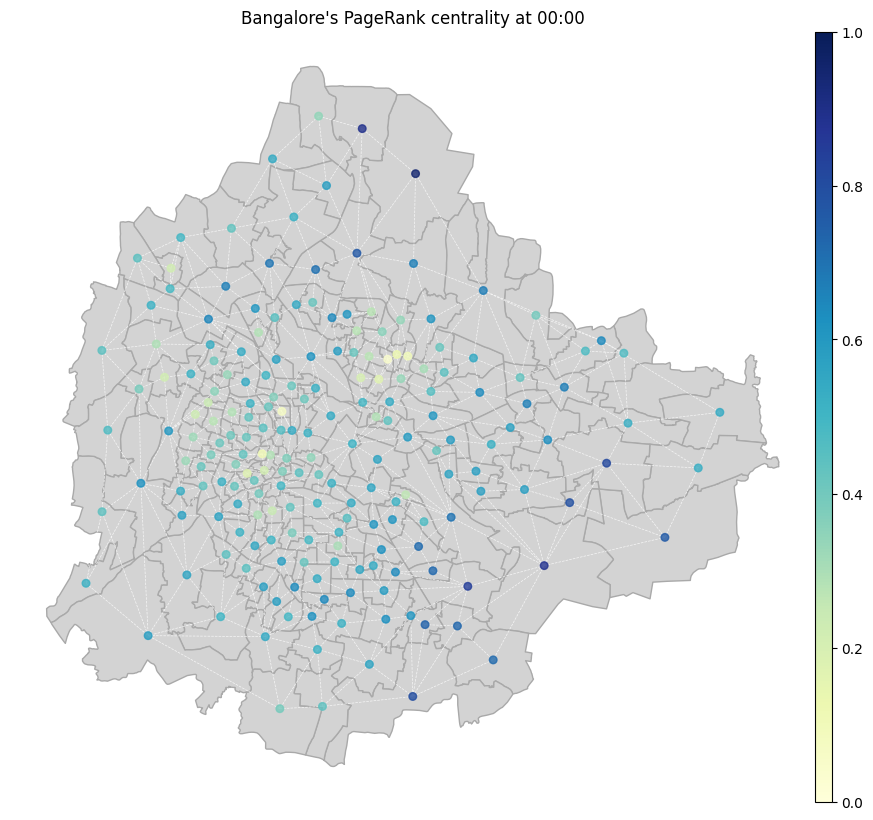

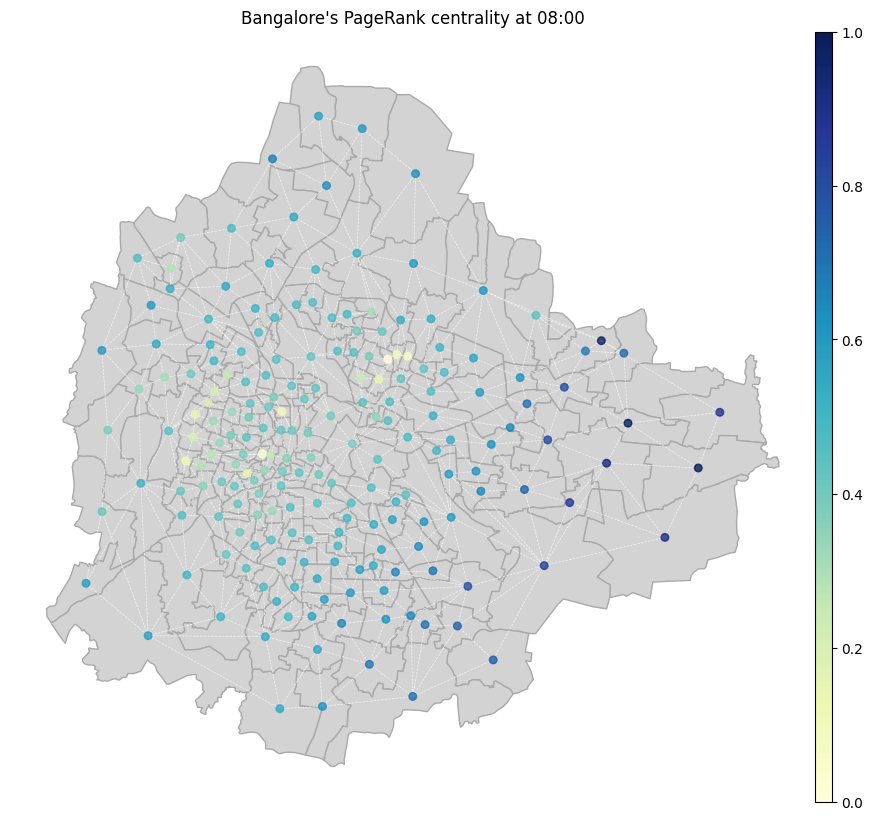

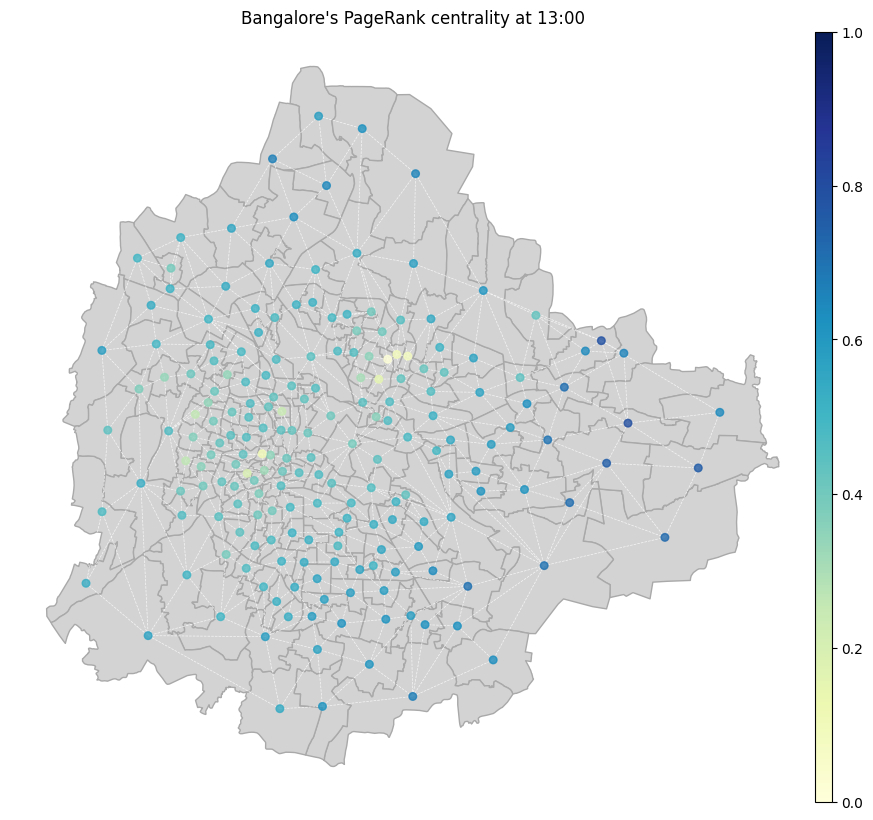

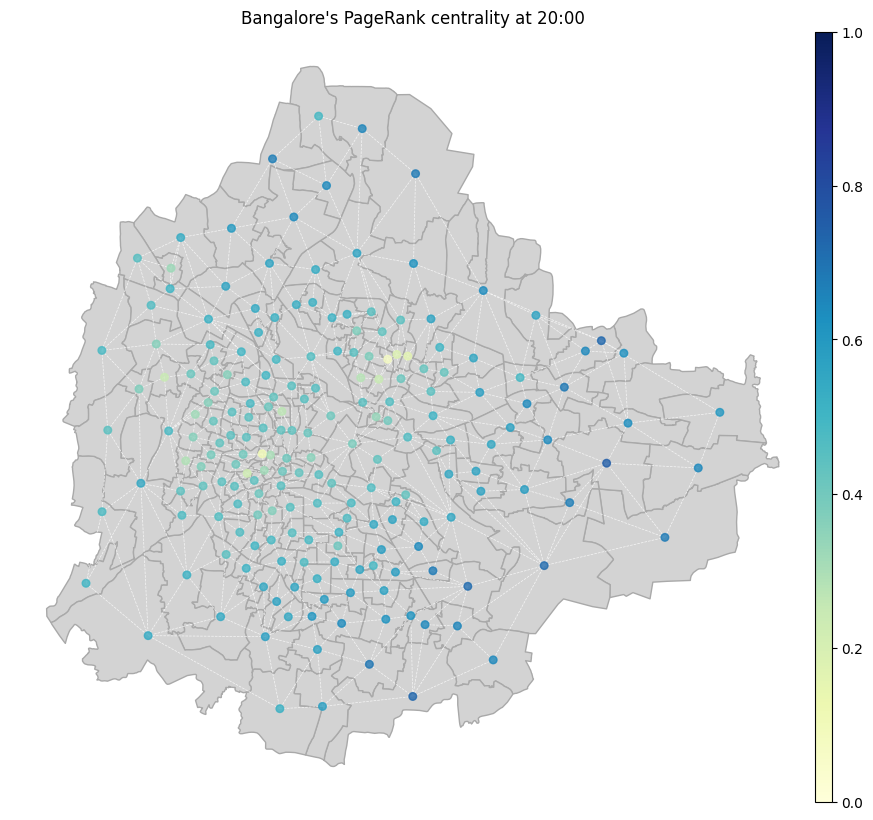

In [58]:
plot_normalized_temporal_centralities(gdf, spatial_network, temporal_networks_pagerank, CITY_NAME, 'PageRank')

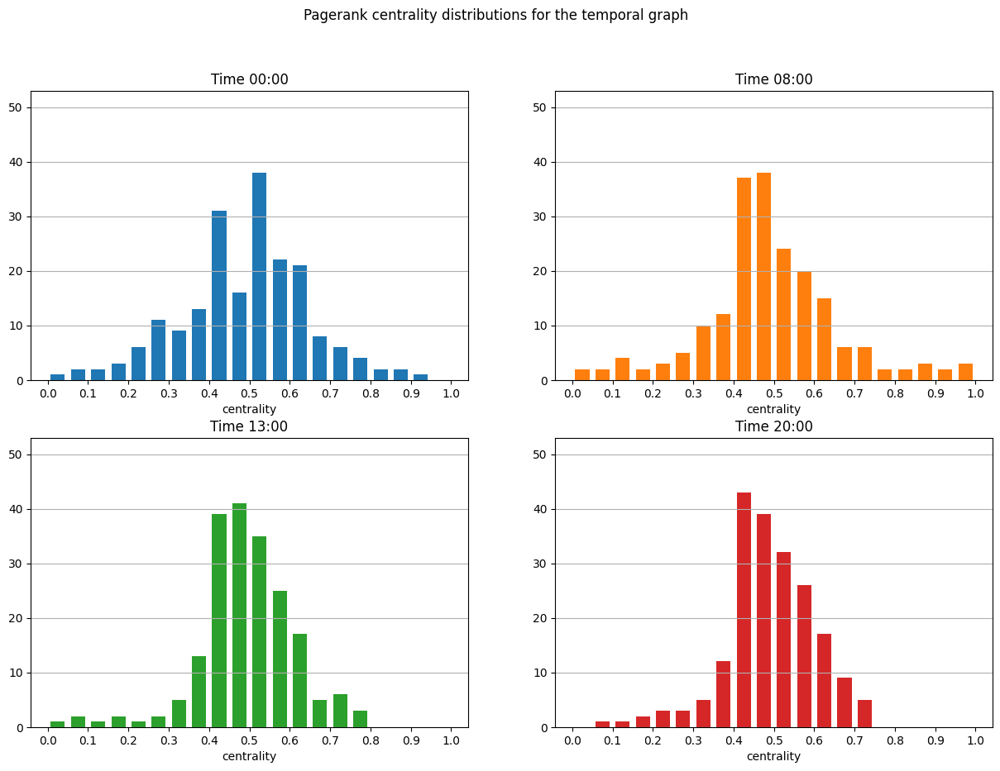

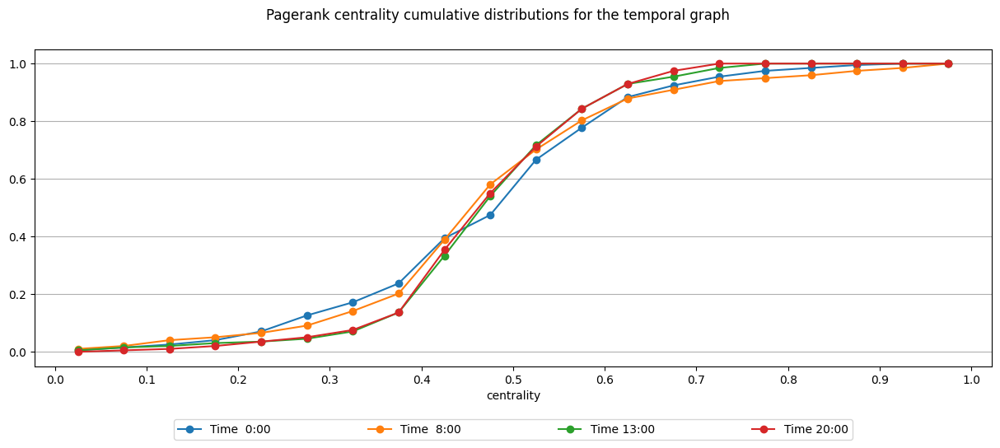

In [59]:
plot_temporal_network_centrality_distribution(temporal_networks_pagerank, 'PageRank centrality')

Spatial Network

In [60]:
spatial_network_pagerank = get_nodes_pagerank_centrality(spatial_network, weight='weight', normalize=True)

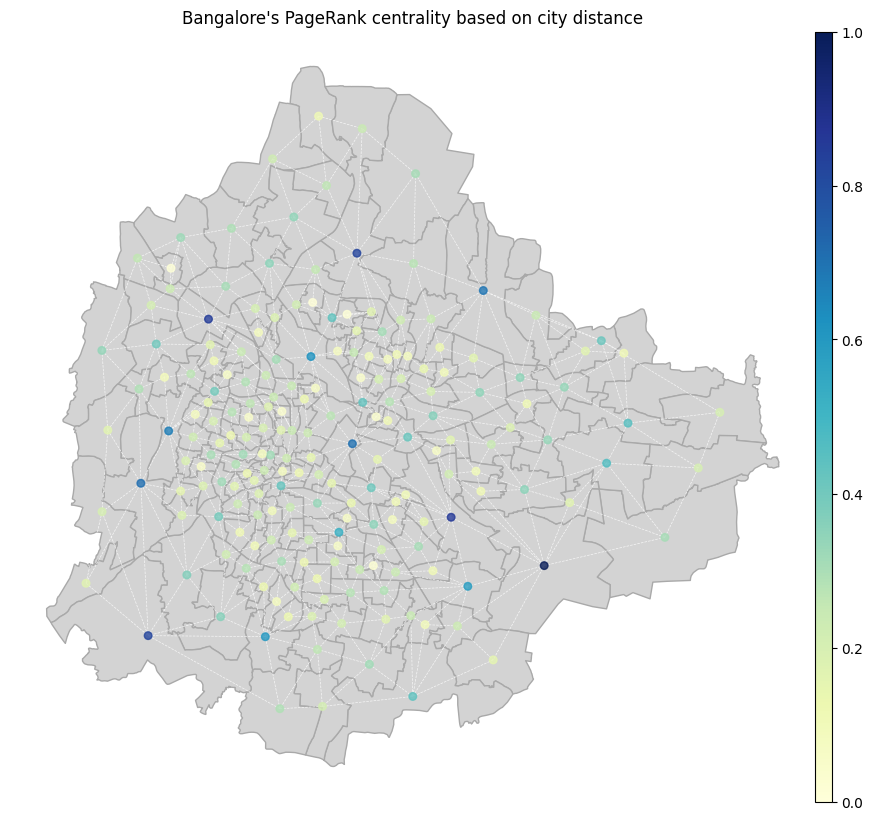

In [61]:
plot_centrality(gdf, spatial_network, spatial_network_pagerank,
                title=f"{CITY_NAME}'s PageRank centrality based on city distance")


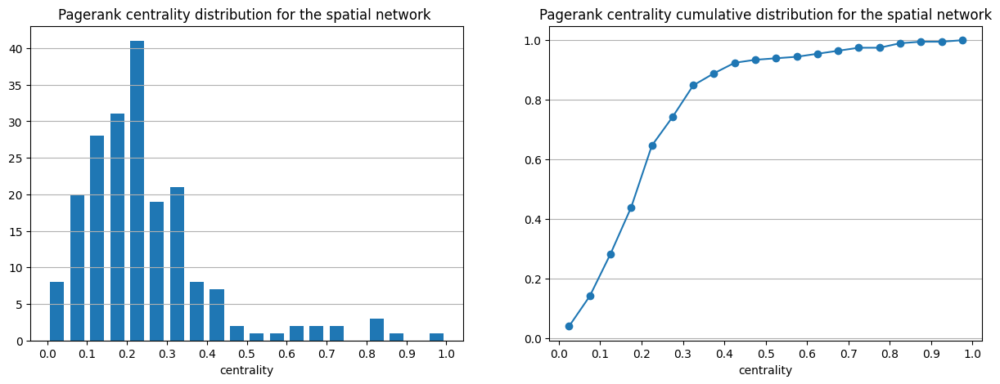

In [62]:
plot_spatial_network_centrality_distribution(spatial_network_pagerank, 'PageRank centrality')

Community detection

In [63]:
RESULTS_DIR = 'results'
os.makedirs(RESULTS_DIR, exist_ok=True)

In [64]:
undirected_temporal_networks_dict = {k: v.to_undirected() for k, v in temporal_networks_dict.items()}

In [65]:
 for k, v in undirected_temporal_networks_dict.items():
   print(f'Undirected temporal network at time {k}: nodes: {len(v.nodes())} edges: {len(v.edges())}') 

Undirected temporal network at time 0: nodes: 198 edges: 16461
Undirected temporal network at time 8: nodes: 198 edges: 18475
Undirected temporal network at time 13: nodes: 198 edges: 18363
Undirected temporal network at time 20: nodes: 198 edges: 18121


In [66]:
for k, v in undirected_temporal_networks_dict.items():
    print(f'Undirected temporal network at time {k} density: {nx.density(v)}') 

Undirected temporal network at time 0 density: 0.8440239963082603
Undirected temporal network at time 8 density: 0.9472901604881301
Undirected temporal network at time 13 density: 0.9415474542378096
Undirected temporal network at time 20 density: 0.9291391068040814


In [67]:
def plot_communities(gdf: gpd.GeoDataFrame, spatial_network: nx.Graph, community_dictionary: Dict[str, int],
                     title: str = 'Metric plot', cmap: colors.ListedColormap = plt.cm.tab10) -> None:
    """Plot the communities of the nodes over the city map.

    Parameters
    ----------
    gdf : gpd.GeoDataFrame
        The geodataframe containing relevant geographic information of the city areas.
    spatial_network : nx.Graph
        The spatial network of the city.
    community_dictionary : { str: int }
        Dictionary that for each node (key) contains its community (value)
    title : str, optional
        The title of the plot, by default 'Metric plot'
    cmap : ListedColormap, optional
        Colormap to use, by default tab10
    """
    _, ax = plt.subplots(1, figsize=(15, 10))

    gdf.plot(ax=ax, edgecolor='darkgray', color='lightgray')

    coordinates = get_geodataframe_coordinates_dict(gdf)
    
    gray = (.5, .5, .5, 1)
    
    node_colors = [cmap(community_dictionary[n]) if n in community_dictionary.keys() else gray
                   for n in spatial_network.nodes()]

    nx.draw(
        spatial_network,
        coordinates,
        ax=ax,
        node_size=30,
        width=.5,
        node_color=node_colors,
        edge_color="white",
        style='--',
        alpha=.8,
    )

    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    if gray in node_colors:
        legend_elements = [Line2D([0], [0], marker='o', color='white', label='Unknown community', 
                                markerfacecolor=gray, markersize=8)]

        ax.legend(handles=legend_elements, loc='lower right')

    ax.set_title(title)

    plt.show()

Community Detection based onWeighted K-Cores

In [68]:
def get_k_cores_communities(network: nx.Graph, weight: Optional[str] = None, k: Optional[int] = None) -> Dict[str, int]:
    """Function to get the k-core partition from a network.

    Parameters
    ----------
    network : Graph
        The network from which the communities are obtained.
    weight : str, optional
        The edge weight to use to compute the communities, by default None.
    k : int, optional
        The core number that the nodes must reach to be part od a community, by default None.
        If None, it will be initialized as the geometric mean of all edges of the network.

    Returns
    -------
    { str: int }
        Dictionary describing for each node (key) the relative community (value).
    """
    new_network = deepcopy(network)
    node_cores_dict = {}
    n = 0
    
    while len(new_network.nodes()):
        try:
            k_core_subgraph = k_core(new_network, k=k, weight=weight)
        except ValueError:
            break

        for node in k_core_subgraph.nodes():
            node_cores_dict[node] = n
            new_network.remove_node(node)
            
        n += 1

    for node in new_network.nodes():
        node_cores_dict[node] = n
    
    return node_cores_dict

In [69]:
def k_core(G: nx.Graph, k: Optional[float] =None, core_number: Optional[Optional[Dict[str, float]]] = None, 
           weight: Optional[str] = None) -> nx.Graph:
    """Returns the k-core of G.

    A k-core is a maximal subgraph that contains nodes of degree k or more.

    Parameters
    ----------
    G : NetworkX graph
      A graph or directed graph
    k : int, optional
      The order of the core.  If not specified return the main core.
    core_number : dictionary, optional
      Precomputed core numbers for the graph G.
    weight : str, optional
      The weight used to compute the k-core

    Returns
    -------
    G : NetworkX graph
      The k-core subgraph

    Raises
    ------
    NetworkXError
      The k-core is not defined for graphs with self loops or parallel edges.

    Notes
    -----
    The main core is the core with the largest degree.

    Not implemented for graphs with parallel edges or self loops.

    For directed graphs the node degree is defined to be the
    in-degree + out-degree.

    Graph, node, and edge attributes are copied to the subgraph.

    See Also
    --------
    core_number

    References
    ----------
    .. [1] An O(m) Algorithm for Cores Decomposition of Networks
       Vladimir Batagelj and Matjaz Zaversnik,  2003.
       https://arxiv.org/abs/cs.DS/0310049
    """

    def k_filter(v, k, c):
        return c[v] >= k

    return _core_subgraph(G, k_filter, k, core_number, weight)

In [70]:
def core_number(G: nx.Graph):
    """Returns the core number for each vertex.

    A k-core is a maximal subgraph that contains nodes of degree k or more.

    The core number of a node is the largest value k of a k-core containing
    that node.

    Parameters
    ----------
    G : NetworkX graph
       A graph or directed graph

    Returns
    -------
    core_number : dictionary
       A dictionary keyed by node to the core number.

    Raises
    ------
    NetworkXError
        The k-core is not implemented for graphs with self loops
        or parallel edges.

    Notes
    -----
    Not implemented for graphs with parallel edges or self loops.

    For directed graphs the node degree is defined to be the
    in-degree + out-degree.

    References
    ----------
    .. [1] An O(m) Algorithm for Cores Decomposition of Networks
       Vladimir Batagelj and Matjaz Zaversnik, 2003.
       https://arxiv.org/abs/cs.DS/0310049
    """
    if nx.number_of_selfloops(G) > 0:
        msg = (
            "Input graph has self loops which is not permitted; "
            "Consider using G.remove_edges_from(nx.selfloop_edges(G))."
        )
        raise NetworkXError(msg)
    degrees = dict(G.degree())
    # Sort nodes by degree.
    nodes = sorted(degrees, key=degrees.get)
    bin_boundaries = [0]
    curr_degree = 0
    for i, v in enumerate(nodes):
        if degrees[v] > curr_degree:
            bin_boundaries.extend([i] * (degrees[v] - curr_degree))
            curr_degree = degrees[v]
    node_pos = {v: pos for pos, v in enumerate(nodes)}
    # The initial guess for the core number of a node is its degree.
    core = degrees
    nbrs = {v: list(nx.all_neighbors(G, v)) for v in G}
    for v in nodes:
        for u in nbrs[v]:
            if core[u] > core[v]:
                nbrs[u].remove(v)
                pos = node_pos[u]
                bin_start = bin_boundaries[core[u]]
                node_pos[u] = bin_start
                node_pos[nodes[bin_start]] = pos
                nodes[bin_start], nodes[pos] = nodes[pos], nodes[bin_start]
                bin_boundaries[core[u]] += 1
                core[u] -= 1
    return core


In [71]:
def core_number_weighted(network: nx.Graph, weight: str) -> Dict[str, float]:
    """Get the weighted core number of each node in the network

    Parameters
    ----------
    network : Graph
        The mnetwork from which the core numbers are obtained
    weight : str
        The name of the weight on the edges that has to be used to compute the weighted core number of the nodes

    Returns
    -------
    { str: float }
        Dictionary containing for each node its weighted core number
    """
    # Get weighted node degree dictionary.
    degrees = dict(network.degree(weight=weight))
    # Sort nodes by non-decreasing degree.
    nodes = sorted(degrees, key=degrees.get)

    # Initialize core_number dictionary
    cores = {k: 0 for k in nodes}

    for i in range(len(nodes)):
        # Get current node
        u = nodes[i]
        # Initialize its core value as its degree
        cores[u] = degrees[u]
        # Update neighbouring nodes core number
        for w in list(nx.all_neighbors(network, u)):
            if cores[u] < degrees[w]:
                degrees[w] = max(degrees[w] - network[u][w][weight], cores[u])
        nodes[i+1:] = sorted({k: v for k, v in degrees.items() if k in nodes[i+1:]}, key=degrees.get)

    return cores

In [72]:
def _core_subgraph(G: nx.Graph, k_filter: Callable[[float, float, Dict[str, float]],bool], k: Optional[float] = None,
                   core: Optional[Dict[str, float]] = None, weight: Optional[str] = None) -> nx.Graph:
    """Returns the subgraph induced by nodes passing filter `k_filter`.

    Parameters
    ----------
    G : NetworkX graph
       The graph or directed graph to process
    k_filter : filter function
       This function filters the nodes chosen. It takes three inputs:
       A node of G, the filter's cutoff, and the core dict of the graph.
       The function should return a Boolean value.
    k : int, optional
      The order of the core. If not specified use the max core number.
      This value is used as the cutoff for the filter.
    core : dict, optional
      Precomputed core numbers keyed by node for the graph `G`.
      If not specified, the core numbers will be computed from `G`.
    weight : str, optional
      The name of the weight on the edges that has to be used to compute the weighted core number of the nodes
    """
    if core is None:
        if weight is None:
          core = core_number(G)
        else:
          core = core_number_weighted(G, weight)
    if k is None:
        k = sum(core.values()) / len(core)
    nodes = (v for v in core if k_filter(v, k, core))
    return G.subgraph(nodes).copy()

In [73]:
from time import time

temporal_networks_k_core_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_k_core_communities[k] = get_k_cores_communities(v, weight='mean_travel_time')
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 0.32 s
Time for computing the temporal network communities at time 08:00: 0.31 s
Time for computing the temporal network communities at time 13:00: 0.32 s
Time for computing the temporal network communities at time 20:00: 0.30 s

Total for computing the temporal network communities at time 20:00: 1.26 s


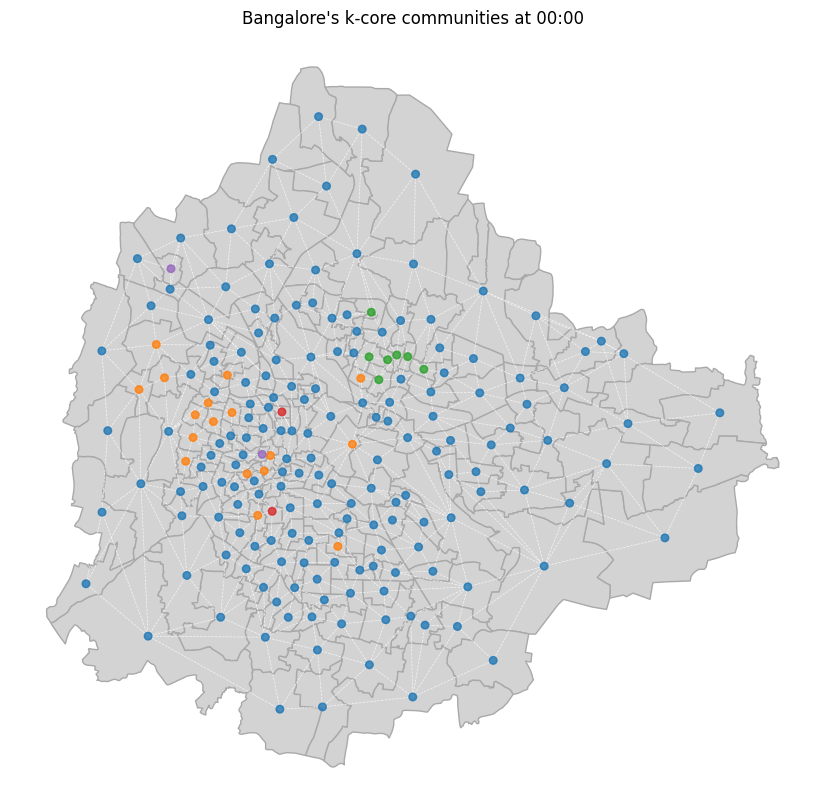

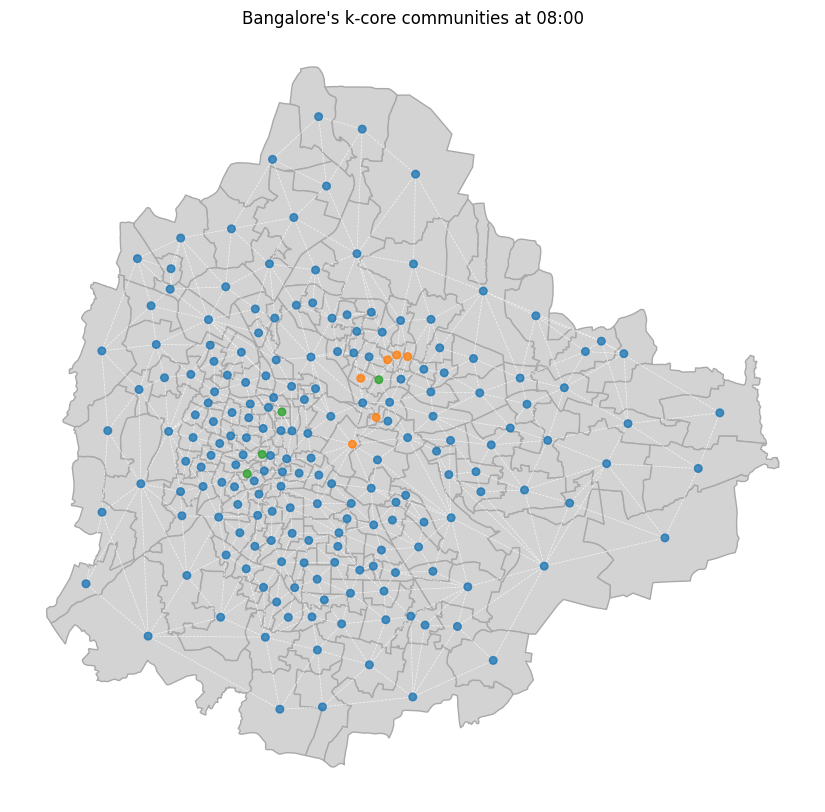

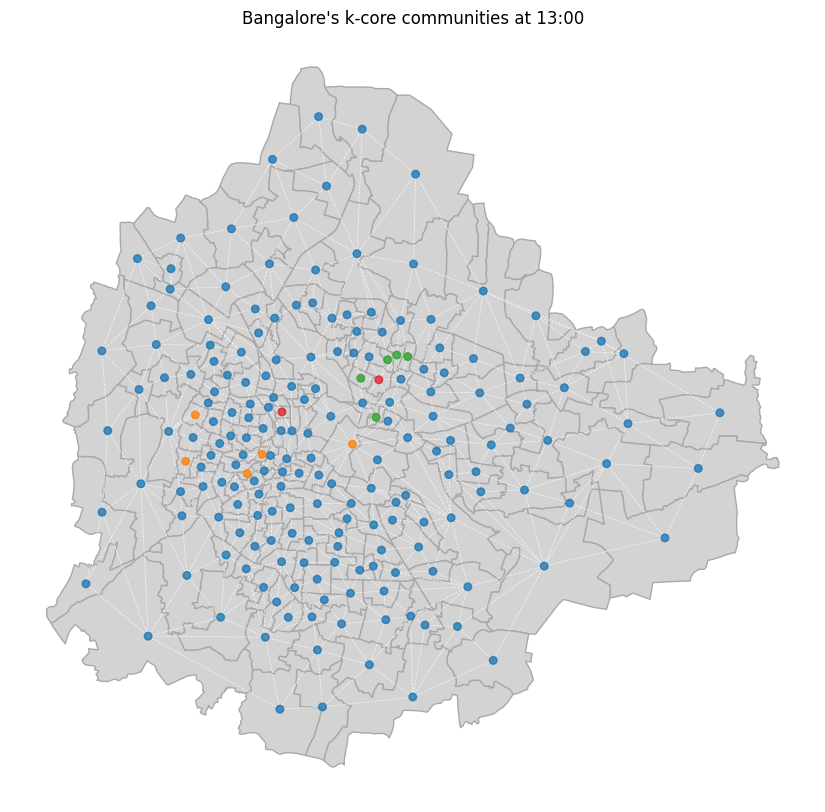

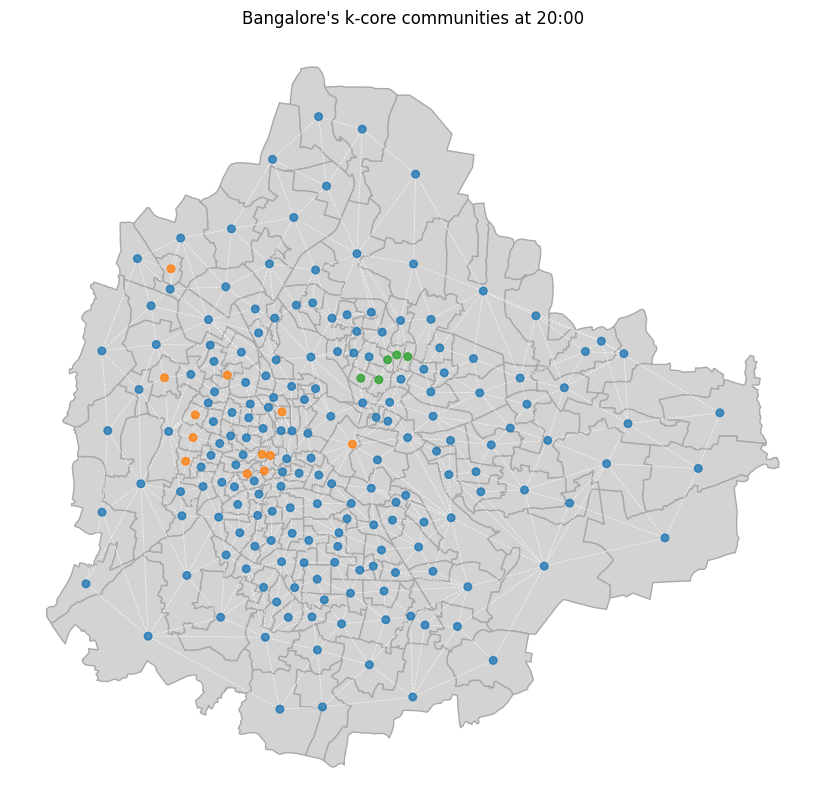

In [74]:
for k, v in temporal_networks_k_core_communities.items():
    plot_communities(gdf, spatial_network, v, title = f"{CITY_NAME}'s k-core communities at {k:02d}:00")

In [75]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_k_core_communities, f)

In [76]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-temporal.pickle'), 'rb') as f:
    temporal_networks_k_core_communities = pickle.load(f)

In [77]:
start_time = time()
spatial_network_k_core_communities = get_k_cores_communities(spatial_network, weight='weight')
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.18 s


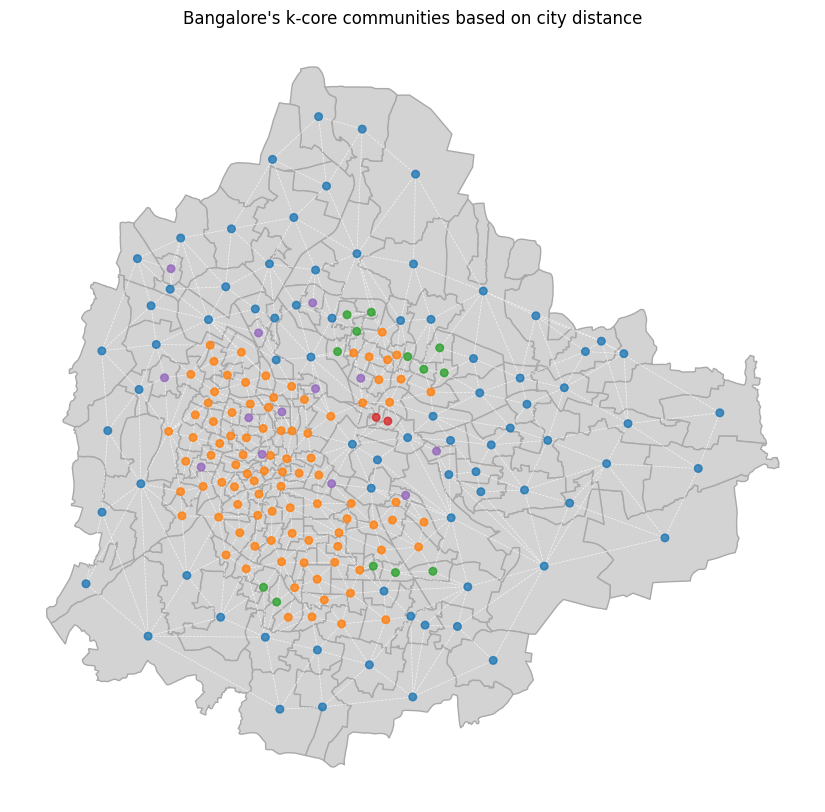

In [78]:
plot_communities(gdf, spatial_network, spatial_network_k_core_communities, 
                 title = f"{CITY_NAME}'s k-core communities based on city distance")

In [79]:
with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_k_core_communities, f)

In [80]:
with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-k-core-spatial.pickle'), 'rb') as f:
    spatial_network_k_core_communities = pickle.load(f)

Louvain Community Detection Algorithm

In [85]:
def get_louvain_communities(network: nx.Graph, weight: Optional[str] = None) -> Dict[str, int]:
    """Function to get the Louvain partition from a network.

    Parameters
    ----------
    network : Graph
        The network from which the communities are obtained.
    weight : str, optional
        The edge weight to use to compute the communities, by default None.

    Returns
    -------
    { str: int }
        Dictionary describing for each node (key) the relative community (value).
    """
    communities = nx.community.louvain_communities(network, weight=weight, resolution=1, threshold=1e-07, seed=42)
    return { c: i for i, community in enumerate(communities) for c in community }

In [86]:
from time import time

temporal_networks_louvain_communities = dict()
times = dict()

for k, v in undirected_temporal_networks_dict.items():
    start_time = time()
    temporal_networks_louvain_communities[k] = get_louvain_communities(v, weight='mean_travel_time')
    times[k] = time() - start_time

for k, t in times.items():
    print(f'Time for computing the temporal network communities at time {k:02d}:00:', f'{t:.2f} s')
print()
print(f'Total for computing the temporal network communities at time {k:02d}:00:', f'{sum(times.values()):.2f} s')

Time for computing the temporal network communities at time 00:00: 0.48 s
Time for computing the temporal network communities at time 08:00: 0.62 s
Time for computing the temporal network communities at time 13:00: 0.38 s
Time for computing the temporal network communities at time 20:00: 0.38 s

Total for computing the temporal network communities at time 20:00: 1.86 s


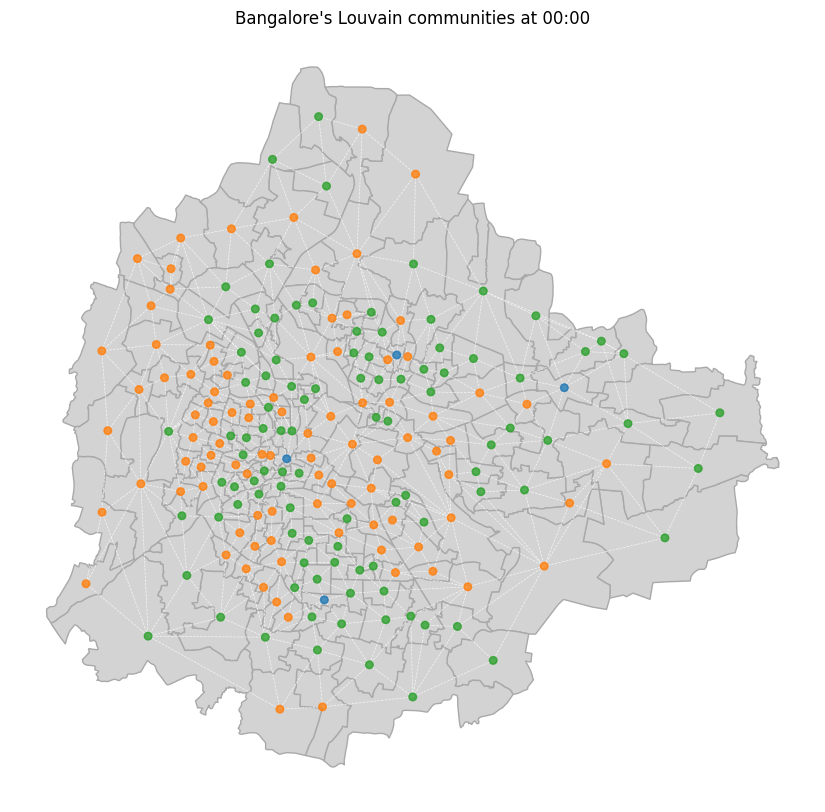

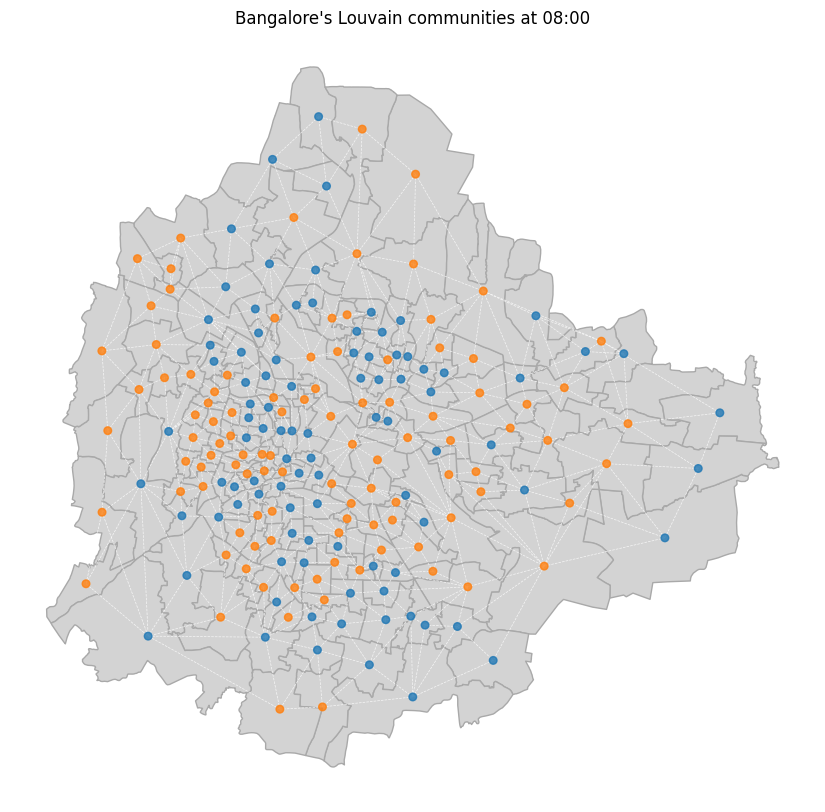

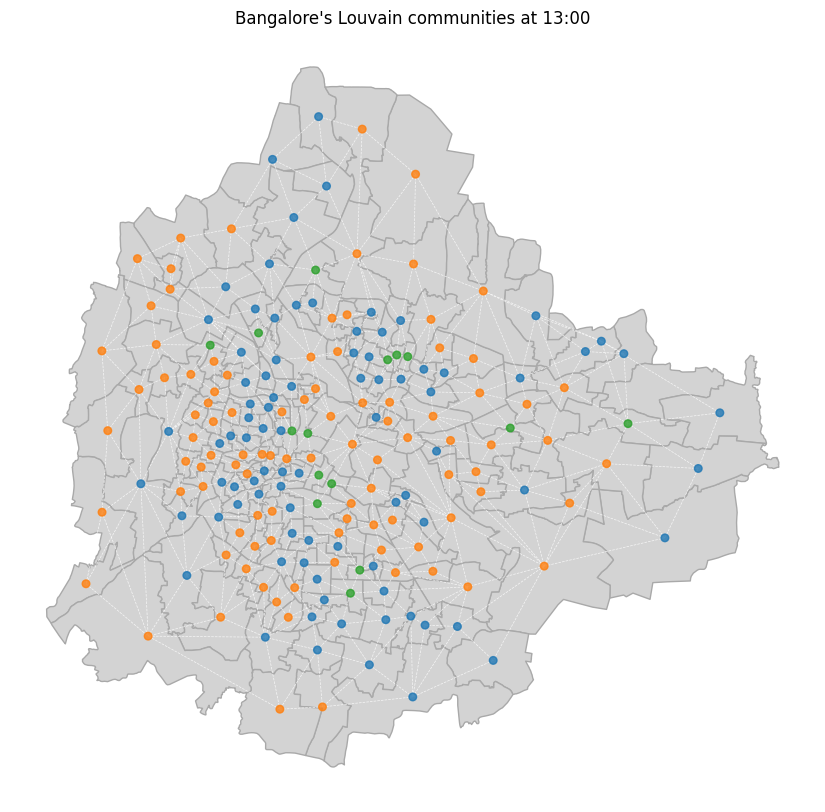

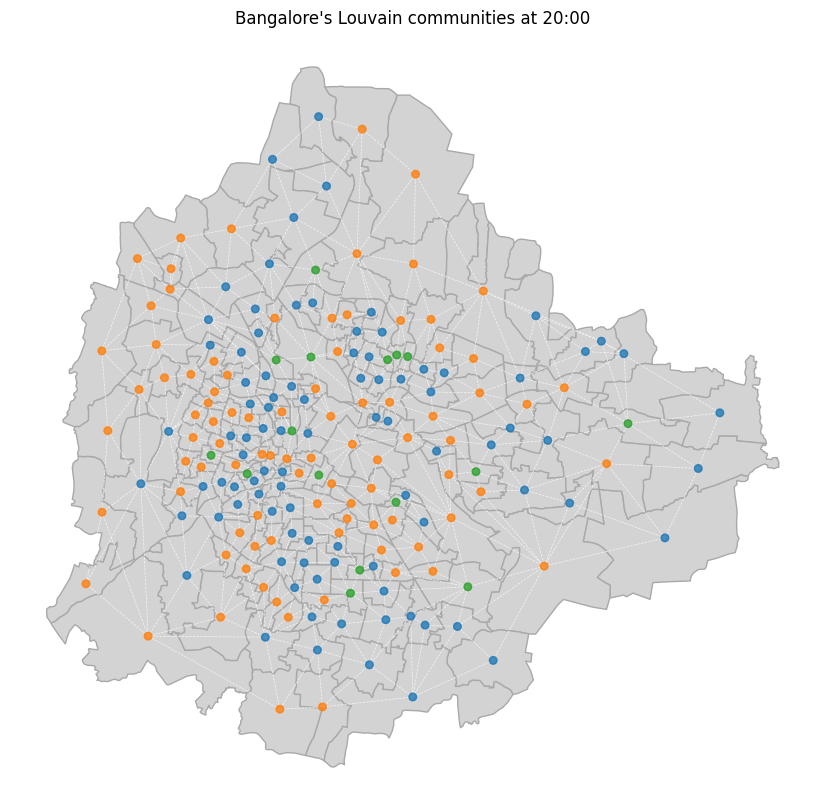

In [87]:
for k, v in temporal_networks_louvain_communities.items():
    plot_communities(gdf, spatial_network, v,
                     title=f"{CITY_NAME}'s Louvain communities at {k:02d}:00")

In [88]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-temporal.pickle'), 'wb') as f:
    pickle.dump(temporal_networks_louvain_communities, f)

In [89]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-temporal.pickle'), 'rb') as f:
    temporal_networks_louvain_communities = pickle.load(f)

In [90]:
start_time = time()
spatial_network_louvain_communities = get_louvain_communities(spatial_network, weight='weight')
print(f'Time for computing the spatial network communities', f'{time() - start_time:.2f} s')

Time for computing the spatial network communities 0.05 s


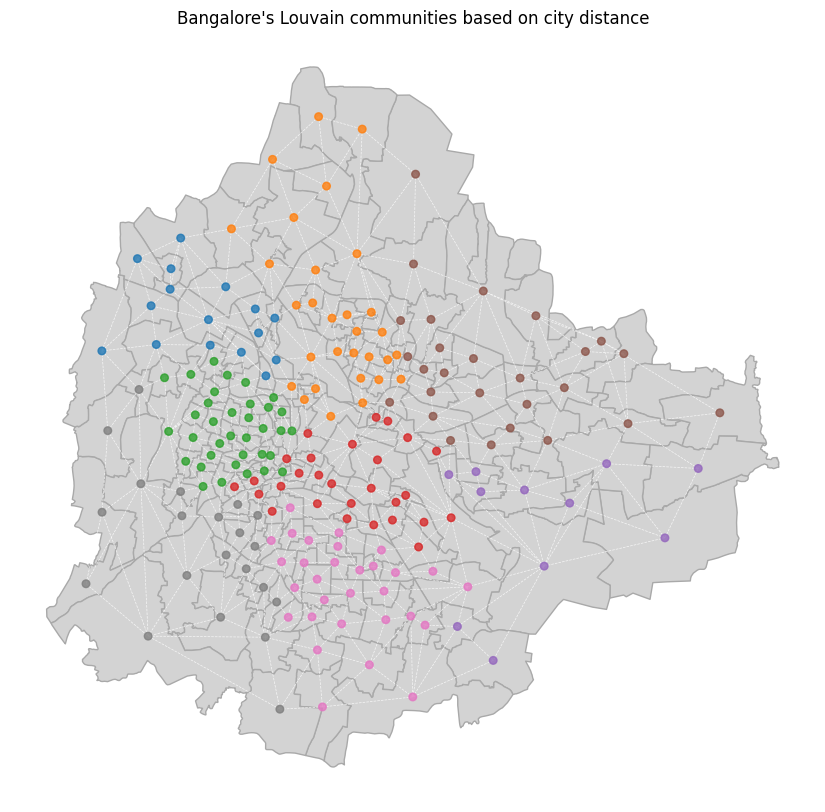

In [91]:
plot_communities(gdf, spatial_network, spatial_network_louvain_communities, 
                 title = f"{CITY_NAME}'s Louvain communities based on city distance")

In [92]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-spatial.pickle'), 'wb') as f:
    pickle.dump(spatial_network_louvain_communities, f)

In [93]:
import pickle

with open(os.path.join(RESULTS_DIR, f'{CITY_NAME}-louvain-spatial.pickle'), 'rb') as f:
    spatial_network_louvain_communities = pickle.load(f)